# Mémoire A5 - Théo JAOUDET
***

## Quelles sont les attentes du marché en matière de technologies d'analyse des performances sportives (chez les amateurs) ?
***

Dans ce mémoire, nous mettons en lumière l'importance croissante des technologies d'analyse des performances sportives chez les amateurs, en soulignant la diversité des outils existants et en développement dans différents sports. La recherche documentaire explore en détail les applications de ces technologies dans des disciplines variées telles que l'athlétisme, le football, la musculation, et bien d'autres, mettant en évidence les besoins des utilisateurs et les tendances du marché.

Les résultats de l'étude, basés sur l'analyse des retours d'un questionnaire, révèlent des attentes significatives des amateurs en matière de technologies d'analyse des performances sportives, offrant ainsi un aperçu précieux des besoins du marché. En conclusion, ce mémoire souligne l'importance de répondre efficacement à ces attentes pour les acteurs du secteur des technologies sportives, en vue d'améliorer l'expérience des sportifs amateurs et de répondre à leurs besoins spécifiques.

***

### Import des librairies

In [1]:
#%pip install matplotlib
#%pip install seaborn
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import re
import random
import seaborn as sns


#pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None  # default='warn'
plt.rcParams.update({'figure.max_open_warning': 0})

### Definition de toutes les fonctions de ce notebook

In [2]:
### Maps informations générales
def sportMap(x):
    if 'Athlétisme' in x:
        x='Athlétisme'
    elif 'Hockey' in x:
        x='Hockey'
    elif 'hiver' in x:
        x='Hiver'
    elif 'combat' in x:
        x='Combat'
    elif 'raquettes' in x:
        x='Raquettes'
    elif 'équestres' in x:
        x='Equestres'
    else:
        return x
    return x
def metierMap(x):
    if 'militaire' in x.lower():
        x="Militaire"
    elif 'cadre' in x.lower():
        x="Cadre"
    elif 'foyer' in x.lower():
        x="Parent au foyer"
    elif 'travail' in x.lower():
        x="Demandeur d'emploi"
    else:
        return x
    return x
def activitéMap(x):
    if 'armée' in x.lower():
        x="Défense et Sécurité"
    elif 'avocat' in x.lower():
        x="Droit"
    elif 'f&b' in x.lower():
        x="Agroalimentaire"
    elif any(c in x.lower() for c in ('business','accounting')) :
        x="Finance"
    elif 'logistique' in x.lower():
        x="Commerce / Distribution"
    elif 'humaines' in x.lower():
        x="Ressources humaines"
    elif 'physique' in x.lower():
        x="Physique / Mécanique"
    elif 'travail' in x.lower():
        x="Chomage"
    elif 'lecture' in x.lower():
        x="Edition"
    elif any(c in x.lower() for c in ('école','lycée')):
        x="Education"
    else:
        return x
    return x
def secteurMap(x):
    if 'seine' in x.lower():
        x="Île-de-France"
    elif 'liban' in x.lower():
        x="Liban"
    elif 'beyrouth' in x.lower():
        x="Liban"
    else:
        return x
    return x

### Maps des raisons et influences
def raisonsNonMap(dicti):
    returnDict = {}
    for x in dicti.keys():
        if 'pas utile à mon niveau de pratique du sport' in x.lower().strip():
            raison="Pas utile à mon niveau de pratique du sport"
        elif "pas nécessaire" in x.lower().strip():
            raison="Pas utile à mon niveau de pratique du sport"
        elif "je trouve difficile de choisir un appareil parmi beaucoup de choix disponibles" in x.lower().strip():
            raison="Je trouve difficile de choisir un appareil parmi beaucoup de choix disponibles"
        elif "pas de connaissance sur l'existence d'un appareil utile pour mon sport" in x.lower().strip():
            raison="Pas de connaissance sur l'existence d'un appareil utile pour mon sport"
        elif "mon club sportif ne possède pas ce type d'appareil" in x.lower().strip():
            raison="Mon club sportif ne possède pas ce type d'appareil"
        elif "connaissance d'un appareil utile mais trop cher" in x.lower().strip():
            raison="Connaissance d'un appareil utile mais trop cher"
        else:
            raison=x

        if(raison not in returnDict.keys()):
            returnDict[raison] = dicti[x]
        else:
            returnDict[raison]+= dicti[x]

    return returnDict
def raisonsOuiMap(dicti):
    returnDict = {}
    for x in dicti.keys():
        if 'pouvoir suivre mes performances' in x.lower().strip():
            raison="Pouvoir suivre mes performances"
        elif "pouvoir améliorer mes performances" in x.lower().strip():
            raison="Pouvoir améliorer mes performances"
        elif "me motiver à pratiquer plus régulièrement mon sport" in x.lower().strip():
            raison="Me motiver à pratiquer plus régulièrement mon sport"
        elif "pouvoir comparer mes performances avec celles d'autres sportifs (mes amis et des pro)" in x.lower().strip():
            raison="Pouvoir comparer mes performances avec celles d'autres sportifs (mes amis et des pro)"
        elif "sur conseils de mon médecin pour une rééducation ou suivi médical" in x.lower().strip():
            raison="Sur conseils de mon médecin pour une rééducation ou suivi médical"
        elif "pouvoir pratiquer mon sport en réduisant les blessures" in x.lower().strip():
            raison="Pouvoir pratiquer mon sport en réduisant les blessures"
        elif "innovation technologique utilisée par les plus grands sportifs" in x.lower().strip():
            raison="Être en possession d'une innovation technologique utilisée par les plus grands sportifs"
        else:
            raison=x

        if(raison not in returnDict.keys()):
            returnDict[raison] = dicti[x]
        else:
            returnDict[raison]+= dicti[x]

    return returnDict
def influenceMap(dfAll):
    indexes = dfAll.index
    dicti = {}
    for ind in indexes:
        dicti[ind] = dfAll["count"].loc[ind]
    returnDict = {}
    for x in dicti.keys():
        if any(c in x.lower() for c in ('suivi','suivre')):
            raison="Pouvoir suivre mes performances"
        elif "pouvoir améliorer mes performances" in x.lower().strip():
            raison="Pouvoir améliorer mes performances"
        else:
            raison=x

        if(raison not in returnDict.keys()):
            returnDict[raison] = dicti[x]
        else:
            returnDict[raison]+= dicti[x]

    return returnDict

### Renvoie une dictionnaire des éléments, séparés par une virgule, d'une colonne d'un dataframe
def countMultiple(dfCol):
    tempDict = {}
    for i in range (len(dfCol)):
        try:
            allCol = dfCol[i].split(',')
            for val in allCol:
                if(val.strip() in tempDict.keys()):
                    tempDict[val.strip()] += 1
                else:
                    tempDict[val.strip()] = 1
        except:
            pass
    return tempDict
### Renvoie une dictionnaire des éléments, séparés par une virgule, des appareils d'un dataframe
def countMultipleAppareils(dfCol):
    tempDict = {}
    for i in dfCol:
        try:
            allCol = i.split(',')
            for val in allCol:
                if(val.strip() in tempDict.keys()):
                    tempDict[val.strip()] += 1
                else:
                    tempDict[val.strip()] = 1
        except:
            pass
    return tempDict
### Renvoie une dictionnaire des éléments, séparés par une virgule, des sports d'un dataframe
def countMultipleSport(dfCol):
    tempDict = {}
    for i in dfCol:
        try:
            allCol = i.split(',')
            for val in allCol:
                if(val.strip() in tempDict.keys()):
                    tempDict[val.strip()] += 1
                else:
                    tempDict[val.strip()] = 1
        except:
            pass
    return tempDict

### Renvoie un dictionnaire des appareils mis en parenthèses
def getParVal(dictTec):
    tempDict = {}
    for i in dictTec.keys():
        try:
            resultat = re.findall(r"(?<=de type\s).*", i)[0][:-1]
            if(resultat in tempDict.keys()):
                tempDict[resultat] += dictTec[i]
            else:
                tempDict[resultat] = dictTec[i]
        except:
            resultat = ""
            
    return tempDict

### Renvoie le numéro de colonne ) à partir du nom
def getColInd(dfCol,mot):
    ind = " "
    for i in dfCol.columns:
        if(mot in i):
            ind=i
            break
    return ind

### Renomme des colonnes
def renameCol(df):
    cols = {}
    for i in df.columns:
        if('approfondi' in i):
            cols[i]='Complexe_Simple'
        elif ("N'hesitez-pas à rajouter" in i):
            cols[i]='Appareils_Utiles'
        elif ("seraient les raisons" in i):
            cols[i]='Raisons'
        elif ("Prix trop élevé" in i):
            cols[i]='Obstacle_Prix'
        elif ("Peur de l'inconfort" in i):
            cols[i]='Obstacle_Inconfort'
        elif ("Peur qu'il soit inutile" in i):
            cols[i]='Obstacle_Inutile'
        elif ("Peur qu'il soit mal utilisé" in i):
            cols[i]='Obstacle_Mauv_Utilisation'
        elif ("mauvaise qualité" in i):
            cols[i]='Obstacle_Qualite'
        elif ("esthétique désagréable" in i):
            cols[i]='Obstacle_Visuel'
        elif ("abonnement pour utiliser" in i):
            cols[i]='Montant_Abonnement'
        elif ("dépenser pour vous procurer" in i):
            cols[i]='Montant_Achat'
        elif ("achat d'un appareil, ou par sa location" in i):
            cols[i]='Achat_Loc'
    df.rename(columns=cols,inplace=True) 
    return df
### Renomme des colonnes pour la HeatMap
def renameColHeat(df):
    cols = {}
    for i in df.columns:
        if('fréquence' in i):
            cols[i]='Fréquence'
        elif ("influence" in i):
            cols[i]='Influence'
        elif ("âge" in i):
            cols[i]='Age'
        elif ("résidence" in i):
            cols[i]='Lieu'
        elif ("catégorie" in i):
            cols[i]='Catégorie'
        elif ("sport principal" in i):
            cols[i]='Sport Principal'
        elif ("secteur" in i):
            cols[i]='Secteur'
        elif ("genre" in i):
            cols[i]='Genre'
        elif ("propre appareil" in i):
            cols[i]='Possession'
        elif ("compétition" in i):
            cols[i]='Compétition'
        elif ("club sportif" in i):
            cols[i]='Club'
        elif ("utilisez-vous un appareil" in i):
            cols[i]='Utilisation'
        elif ("appareil reconditionné" in i):
            cols[i]='Reconditionné'
    df.rename(columns=cols,inplace=True) 
    return df

### Renvoie un choix aléatoire si non existant
def nanAchat_Loc(x):
    choice = ['Achat','Location']
    try:
        x = float(x)
        x = random.choice(choice)
        return x
    except:
        if x==0:
            x = random.choice(choice)
            return x
        else:
            return x        

### Nettoyage et mise en forme des données

In [3]:
url="https://docs.google.com/spreadsheets/d/16cXP4m1XDYwKcRIeeElBl6HpkMul82d4VYYz6XiTwOg/export?format=csv&gid=1905028942"
dfAll = pd.read_csv(url,sep=',')
dfAll.drop(columns=['Horodateur'],inplace=True)
dfAll.dropna(axis=0,inplace=True,how='all')

column_to_move = dfAll.pop("Qui serait votre principale influence à l'utilisation d'un appareil de suivi des performances ?")
dfAll.insert(6, "Qui serait votre principale influence à l'utilisation d'un appareil de suivi des performances ?", column_to_move)
column_to_move = dfAll.pop("Préfèreriez-vous avoir votre propre appareil, ou bien utiliser un appareil présent directement à l'endroit où vous pratiquer votre sport ?")
dfAll.insert(7, "Préfèreriez-vous avoir votre propre appareil, ou bien utiliser un appareil présent directement à l'endroit où vous pratiquer votre sport ?", column_to_move)
column_to_move = dfAll.pop("Est-ce que l'achat d'un appareil reconditionné / d'occasion, et donc moins cher, vous intéresserait ?")
dfAll.insert(8, "Est-ce que l'achat d'un appareil reconditionné / d'occasion, et donc moins cher, vous intéresserait ?", column_to_move)

dfAll["Quel est votre sport principal dans la liste ci-dessous ?"] = dfAll["Quel est votre sport principal dans la liste ci-dessous ?"].map(sportMap)
dfAll["Quelle est votre catégorie socio-professionnelle ?"]=dfAll["Quelle est votre catégorie socio-professionnelle ?"].map(metierMap)
dfAll["Quel est votre secteur d'activité ?"]=dfAll["Quel est votre secteur d'activité ?"].map(activitéMap)
dfAll["Quelle est votre principale région de résidence ?"]=dfAll["Quelle est votre principale région de résidence ?"].map(secteurMap)
dfAll['count']=0
dfAll

,À quelle fréquence pratiquez-vous une activité sportive ?,"Pratiquez-vous un sport en club sportif ? (salle de sport, club de football, cours de boxe, etc)","Pratiquez-vous un sport en compétition ? (tournois sportifs, marathon, championnats, etc)","Lors de la pratique de votre sport, utilisez-vous un appareil de suivi de vos performances ? (montre connectée, capteur sur soi, application mobile, etc)",Si oui quel(s) appareil(s) utilisez-vous ?,Si non pour quelles raisons ?,Qui serait votre principale influence à l'utilisation d'un appareil de suivi des performances ?,"Préfèreriez-vous avoir votre propre appareil, ou bien utiliser un appareil présent directement à l'endroit où vous pratiquer votre sport ?","Est-ce que l'achat d'un appareil reconditionné / d'occasion, et donc moins cher, vous intéresserait ?",Quel est votre sport principal dans la liste ci-dessous ?,...,"Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.6","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.7","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.8","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.9","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.10","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.11","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.12","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.13","Seriez-vous plus intéressé par l'achat d'un appareil, ou par sa location ?.14",count
0,Régulièrement chaque semaine,Oui,Oui,Non,NaN,Pas de connaissance sur l'existence d'un appar...,Mon entraineur m'en a conseillé un,Mon propre appareil,"Peut-être, cela dépend de l'état du produit",Hockey,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,Régulièrement chaque semaine,Oui,Non,Non,NaN,Pas de connaissance sur l'existence d'un appar...,Mon entraineur m'en a conseillé un,Mon propre appareil,"Peut-être, cela dépend de l'état du produit",Raquettes,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,Régulièrement chaque mois,Oui,Oui,Non,NaN,Pas utile à mon niveau de pratique du sport,Des amis l'utilisent,Mon propre appareil,"Peut-être, cela dépend de l'état du produit",Football,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,Régulièrement chaque semaine,Non,Non,Non,NaN,Pas utile à mon niveau de pratique du sport,Des amis l'utilisent,Mon propre appareil,"Oui, s'il fonctionne c'est le principal",Football,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,Régulièrement chaque semaine,Oui,Non,Non,NaN,Pas utile à mon niveau de pratique du sport,Des amis l'utilisent,Mon propre appareil,"Non, je préfère un produit neuf",Musculation,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124,Régulièrement chaque mois,Non,Non,Non,NaN,Connaissance d'un appareil utile mais trop cher,Des amis l'utilisent,Mon propre appareil,"Oui, s'il fonctionne c'est le principal",Equestres,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Achat,NaN,0
125,Régulièrement chaque semaine,Oui,Oui,Non,NaN,NaN,Des fédérations sportives professionnelles / c...,Un appareil présent sur place,"Oui, s'il fonctionne c'est le principal",Equestres,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Location,NaN,0
126,Régulièrement chaque semaine,Non,Non,Non,NaN,Pas utile à mon niveau de pratique du sport,Des amis l'utilisent,Mon propre appareil,"Peut-être, cela dépend de l'état du produit",Musculation,...,NaN,Achat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
127,Régulièrement chaque semaine,Oui,Non,Oui,Polar watch,NaN,Une nouvelle experience,Mon propre appareil,"Non, je préfère un produit neuf",Natation,...,NaN,NaN,Achat,NaN,NaN,NaN,NaN,NaN,NaN,0


In [4]:
print(f"Il y eu {len(dfAll)} réponses au questionnaire")

Il y eu 129 réponses au questionnaire


### Analyses des participants

<Axes: title={'center': 'Genre des participants'}, ylabel='Genre'>

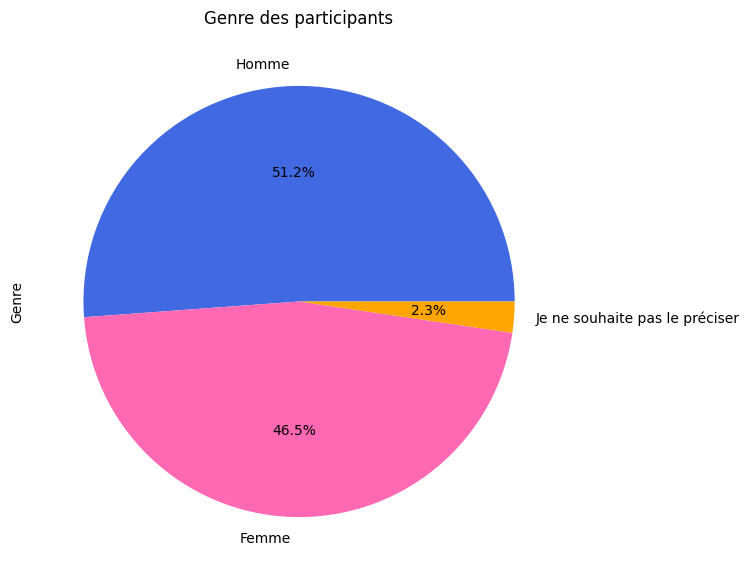

In [5]:
figWeight,figHeight = 10,7 
tempDf=dfAll.groupby(getColInd(dfAll,'genre')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Genre des participants",ylabel='Genre',autopct='%1.1f%%',colors= ['royalblue','hotpink','orange'])

<Axes: title={'center': 'Age des participants'}, ylabel='Age'>

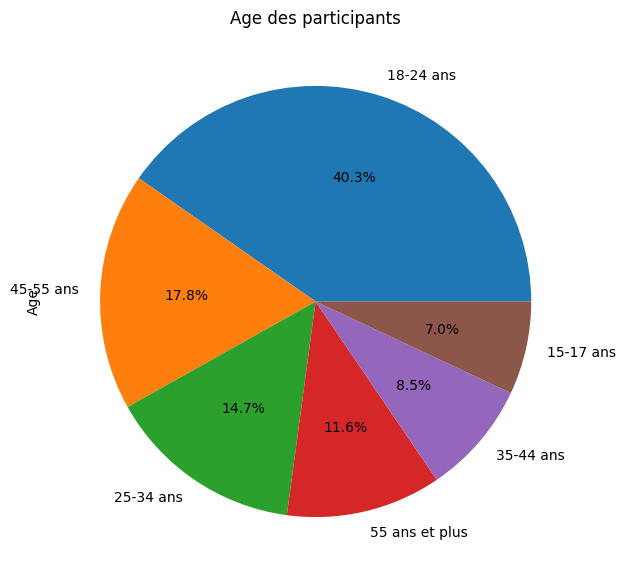

In [6]:
tempDf=dfAll.groupby(getColInd(dfAll,"tranche d'âge")).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Age des participants",ylabel='Age',autopct='%1.1f%%')

<Axes: title={'center': 'Statut des participants'}, ylabel='Statut'>

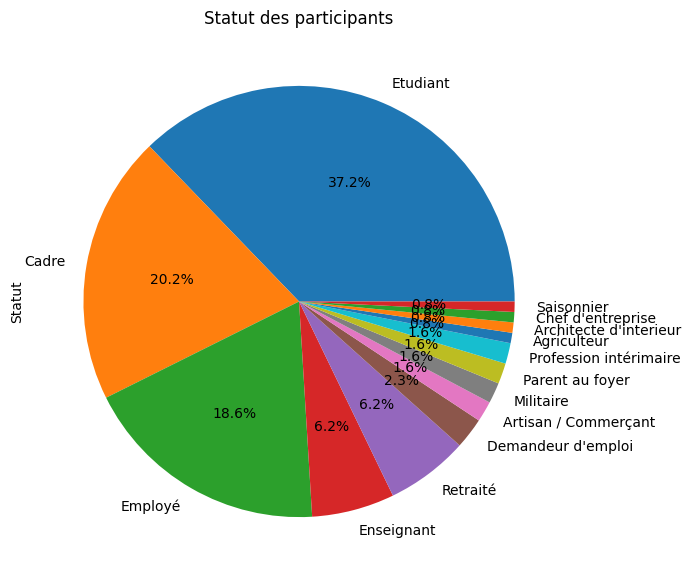

In [7]:
tempDf=dfAll.groupby(getColInd(dfAll,'socio-professionnelle')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Statut des participants",ylabel='Statut',autopct='%1.1f%%')

<Axes: title={'center': 'Secteur des participants'}, ylabel='Secteur'>

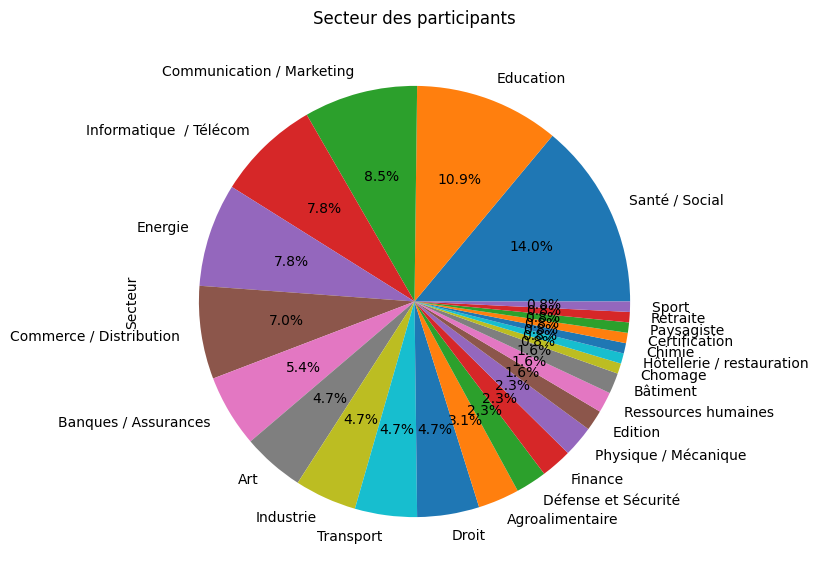

In [8]:
tempDf=dfAll.groupby(getColInd(dfAll,'secteur')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Secteur des participants",ylabel='Secteur',autopct='%1.1f%%')

<Axes: title={'center': 'Lieu des participants'}, ylabel='Lieu'>

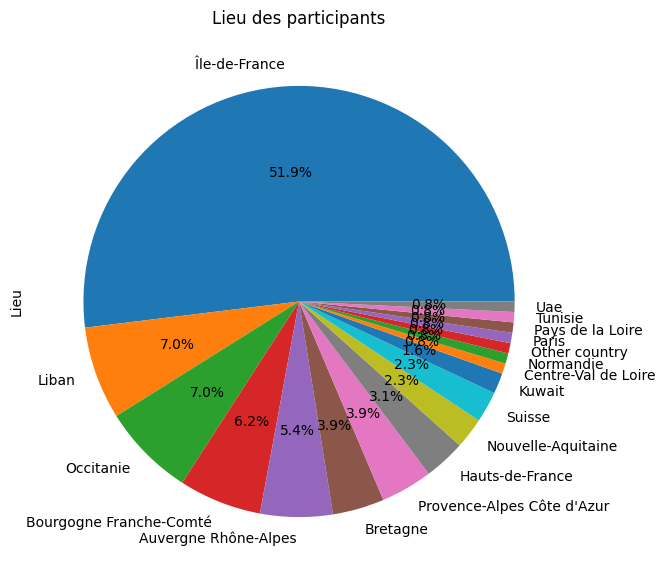

In [9]:
tempDf=dfAll.groupby(getColInd(dfAll,'principale région')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Lieu des participants",ylabel='Lieu',autopct='%1.1f%%')

<Axes: title={'center': 'Fréquence des sessions de sport'}, ylabel='Fréquence'>

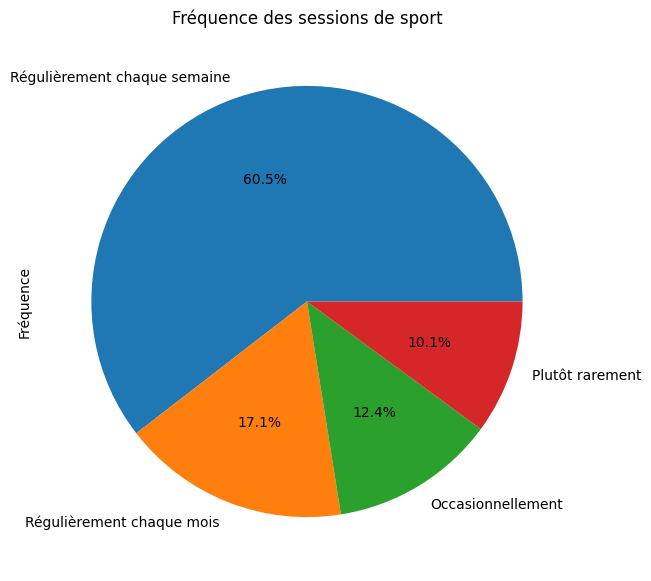

In [10]:
tempDf=dfAll.groupby(dfAll.columns[0]).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Fréquence des sessions de sport",ylabel='Fréquence',autopct='%1.1f%%')

<Axes: title={'center': 'Pratiquez-vous un sport en club'}, ylabel='Club'>

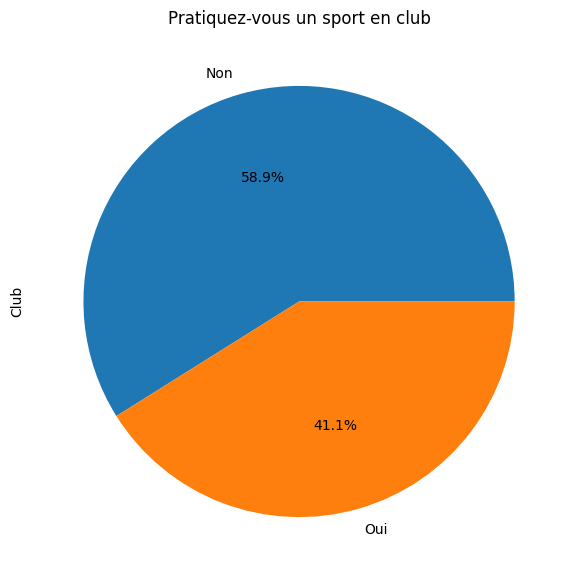

In [11]:
tempDf=dfAll.groupby(dfAll.columns[1]).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Pratiquez-vous un sport en club",ylabel='Club',autopct='%1.1f%%')

<Axes: title={'center': 'Pratiquez-vous un sport en competition'}, ylabel='Competition'>

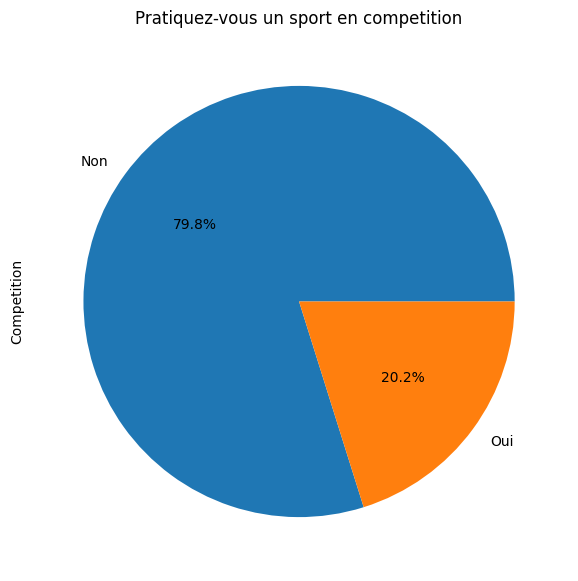

In [12]:
tempDf=dfAll.groupby(dfAll.columns[2]).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Pratiquez-vous un sport en competition",ylabel='Competition',autopct='%1.1f%%')

<Axes: title={'center': 'Sport avec appareil'}, ylabel='Appareil'>

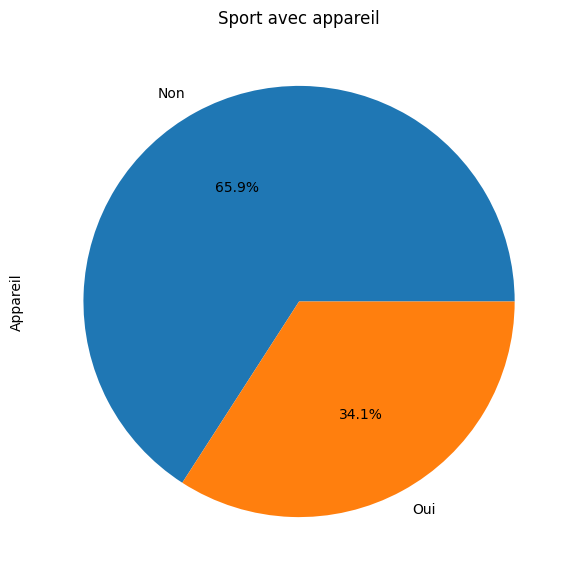

In [13]:
tempDf=dfAll.groupby(dfAll.columns[3]).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(kind='pie',figsize=(figWeight,figHeight),title="Sport avec appareil",ylabel='Appareil',autopct='%1.1f%%')

In [14]:
tempDf=dfAll[dfAll.columns[4]].dropna()
tempDf.sort_values().to_frame()

,Si oui quel(s) appareil(s) utilisez-vous ?
72,Apple Watch
54,Apple watch
51,Apple watch
25,Apple watch
110,Application
31,Application mobile
122,Application mobile
35,Application sur téléphone
78,Application téléphone
128,Fitbit


<Axes: title={'center': 'Obstacles'}, ylabel='Obstacles'>

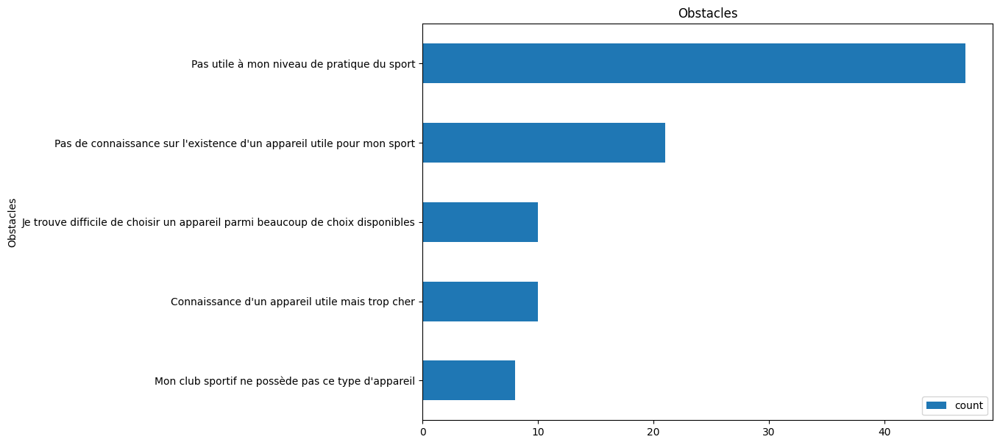

In [15]:
minValues = 2
tempDf = countMultiple(dfAll[dfAll.columns[5]])
tempDf = raisonsNonMap(tempDf)
tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
tempDfMin = tempDf[tempDf["count"]<=minValues]
tempDf = tempDf[tempDf["count"]>minValues]
tempDf.sort_values(by='count',ascending=True).head().plot(kind='barh',figsize=(10,7),title="Obstacles",ylabel="Obstacles")

In [16]:
tempDfMin.sort_values(by='count',ascending=False)

,count
Je n'aime pas courir avec un téléphone dans la poche,1
Flemme,1
c est dangereux,1
Pour des renseignements,1
Je n'en vois pas l'intérêt,1
Étant une ancienne sportive en sport Études- je connais mes limites et l’entraînement adapté pour un résultat bénéfique.,1
No need,1


<Axes: title={'center': 'Influence pour utilisation'}, ylabel='Influenceur'>

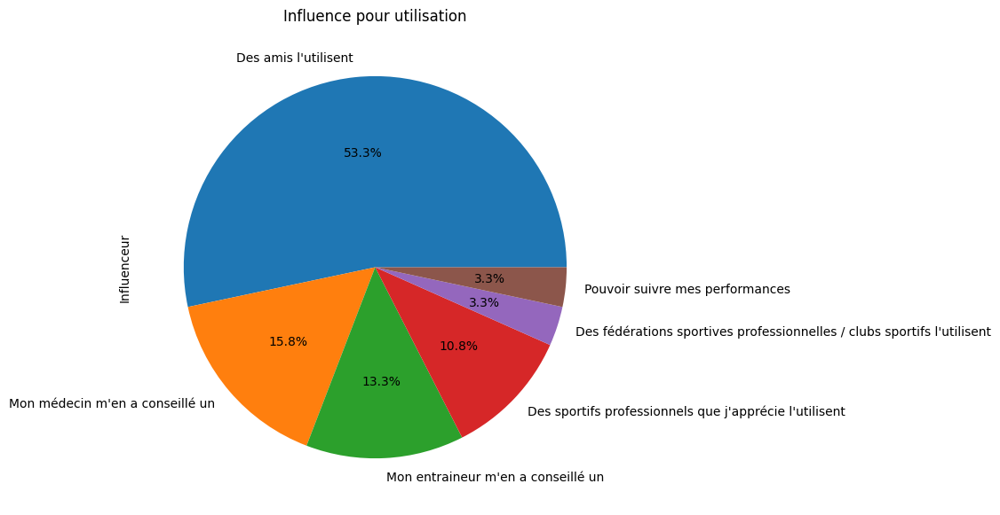

In [17]:
minValues = 2
tempDf=dfAll.groupby(getColInd(dfAll,'influence')).count().sort_values(by='count',ascending=False)
tempDf = influenceMap(tempDf)
tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
tempDfMin = tempDf[tempDf["count"]<=minValues]
tempDf = tempDf[tempDf["count"]>minValues]
tempDf["count"].sort_values(ascending=False).plot(kind='pie',figsize=(figWeight,figHeight),title="Influence pour utilisation",ylabel='Influenceur',autopct='%1.1f%%')

In [18]:
tempDfMin['count'].to_frame()

,count
Aucun,1
Si je veux prendre le sport serieusement et comme priorité,1
"curiosité personnelle, stats",1
Une nouvelle experience,1
Not accurate,1
Permet une analyse des entraînements et compétitions,1
Moi même,1
Juste la disponibilité de l’app sur mon iphone,1
suggestion téléphone,1


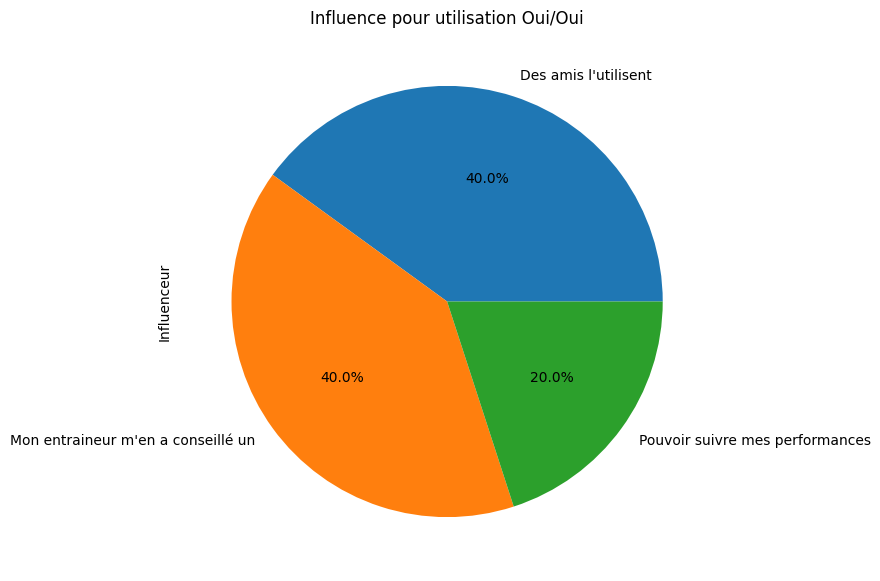

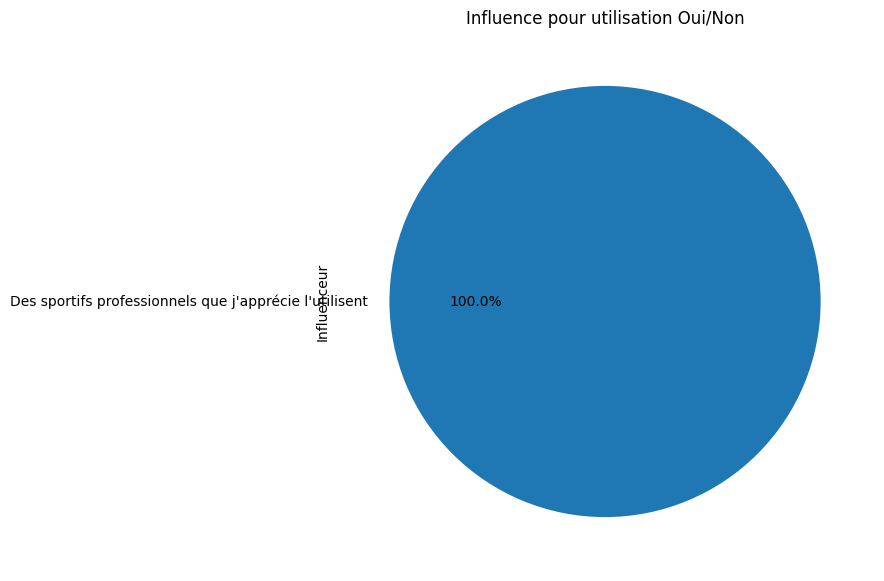

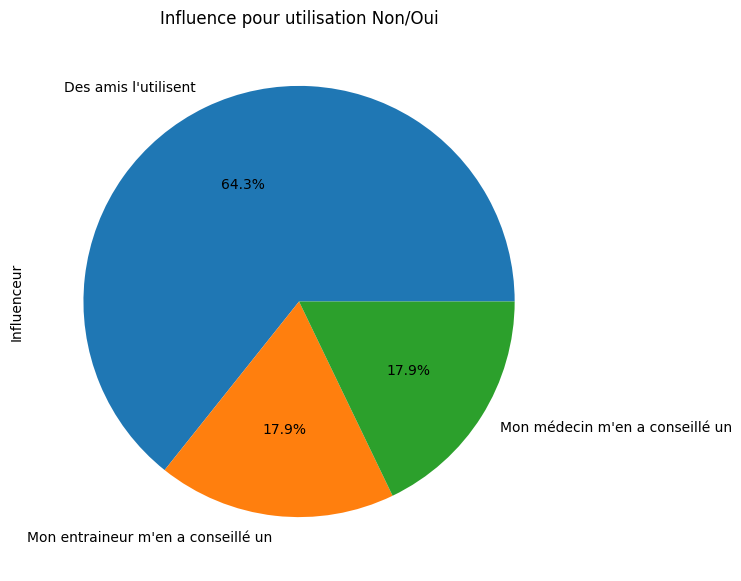

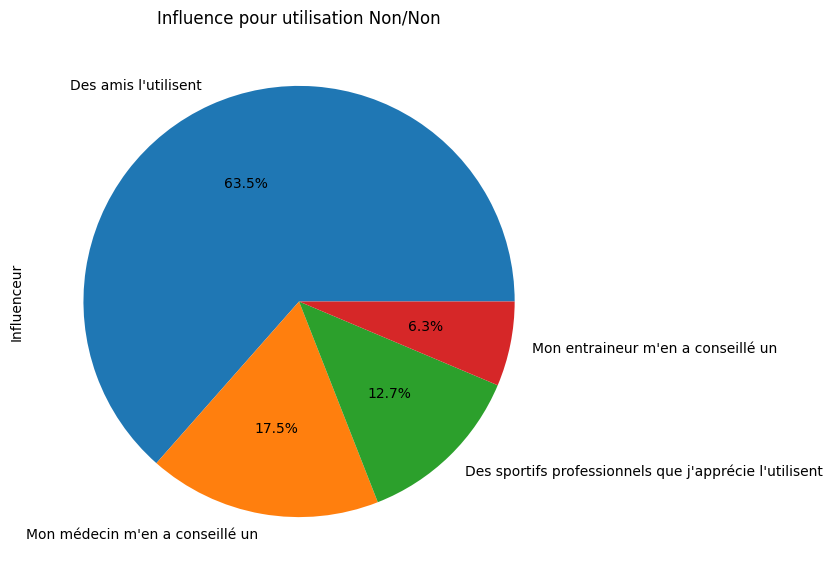

In [19]:
minValues = 2
raisonsBool = ['Oui','Non']
raisonsBool2 = ['Oui','Non']

for r1 in raisonsBool:
    for r2 in raisonsBool2:
        tempDf = dfAll[(dfAll['Pratiquez-vous un sport en compétition ? (tournois sportifs, marathon, championnats, etc)']==r1)&(dfAll['Pratiquez-vous un sport en club sportif ? (salle de sport, club de football, cours de boxe, etc)']==r2)]
        tempDf=tempDf.groupby(getColInd(dfAll,'influence')).count().sort_values(by='count',ascending=False)
        tempDf = influenceMap(tempDf)
        tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
        tempDfMin = tempDf[tempDf["count"]<=minValues]
        tempDf = tempDf[tempDf["count"]>minValues]
        tempDf["count"].sort_values(ascending=False).plot(kind='pie',figsize=(figWeight,figHeight),title=f"Influence pour utilisation {r1}/{r2}",ylabel='Influenceur',autopct='%1.1f%%')
        plt.show()
#tempDf.iloc[:,1].plot(kind='barh',figsize=(figWeight,figHeight),title="Influence pour utilisation",ylabel='Influenceur')

<Axes: title={'center': "Possession de l'appareil"}, ylabel='Possession'>

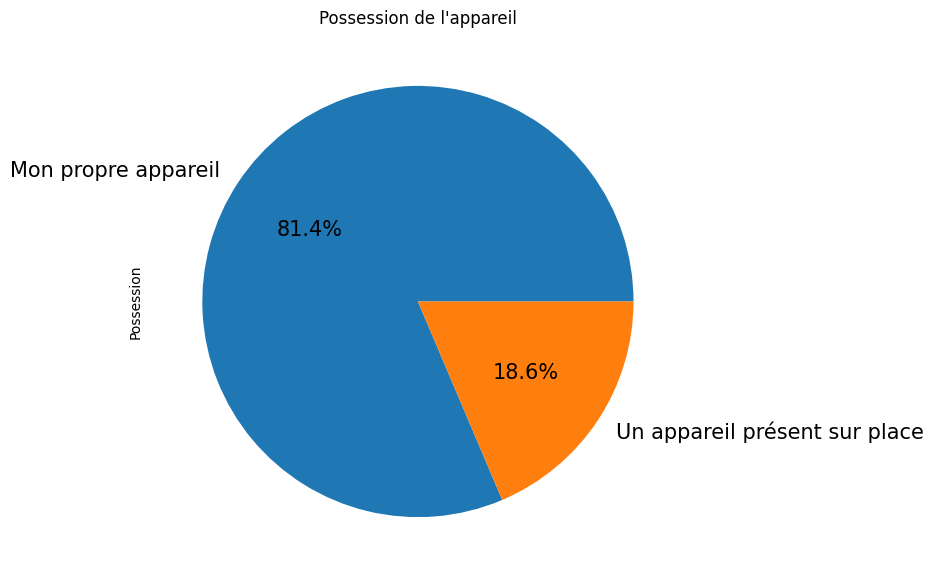

In [20]:
tempDf=dfAll.groupby(getColInd(dfAll,'votre propre appareil')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(fontsize=15,kind='pie',figsize=(figWeight,figHeight),title="Possession de l'appareil",ylabel='Possession',autopct='%1.1f%%')

<Axes: title={'center': 'Appareil reconditionné'}, ylabel='Possession'>

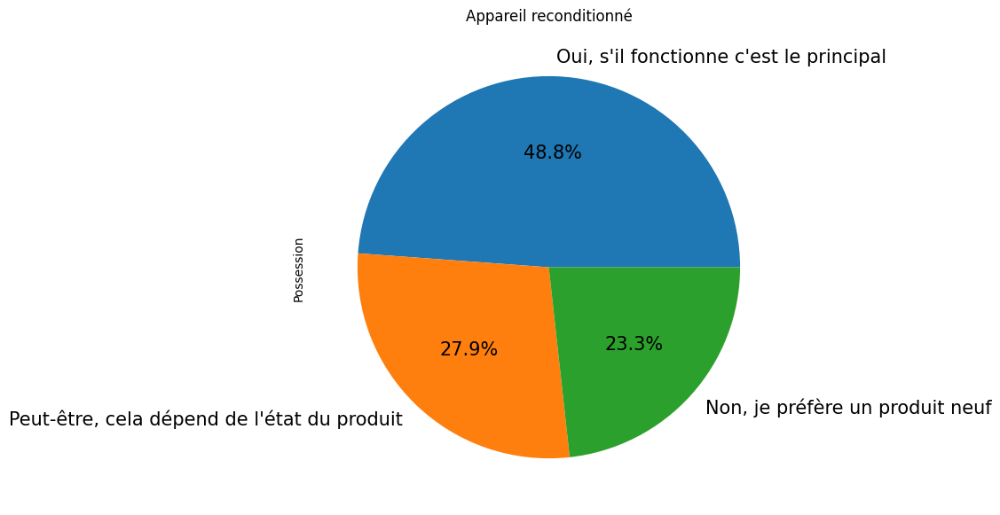

In [21]:
tempDf=dfAll.groupby(getColInd(dfAll,'donc moins cher')).count().sort_values(by='count',ascending=False)
tempDf.iloc[:,1].plot(fontsize=15,kind='pie',figsize=(figWeight,figHeight),title="Appareil reconditionné",ylabel='Possession',autopct='%1.1f%%')

<Axes: title={'center': 'Sport Principal'}, ylabel='Sport'>

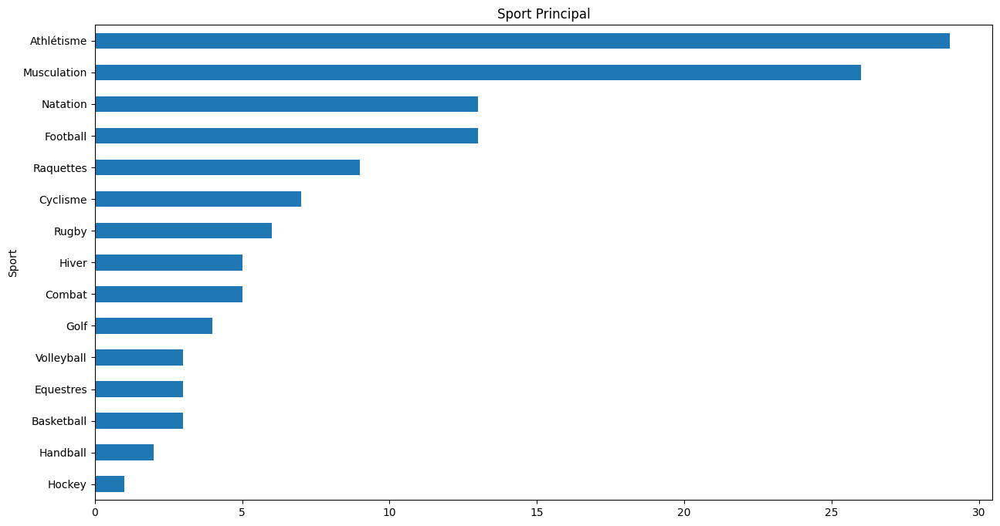

In [22]:
tempDf=dfAll.groupby(dfAll.columns[9]).count().sort_values(by='count',ascending=True)
tempDf.iloc[:,1].plot(kind='barh',figsize=(15,8),title="Sport Principal des participants",ylabel='Sport')

### Uniformisation puis séparation selon les sports

In [23]:
sports = {}
for i in range (len(dfAll)):
    tempSport = dfAll['Quel est votre sport principal dans la liste ci-dessous ?'].iloc[i]
    if(tempSport not in sports):
        sports[tempSport] = 1
    else:
        sports[tempSport]+=1
        
dictDF ={}
for sport in sports.keys():
    dictDF[sport] = dfAll[dfAll['Quel est votre sport principal dans la liste ci-dessous ?']==sport]
    dictDF[sport].dropna(axis=1,inplace=True,how='all')
    renameCol(dictDF[sport])
    if 'Achat_Loc' not in dictDF[sport].columns:
        dictDF[sport]['Achat_Loc'] = 0
        dictDF[sport]['Achat_Loc'] = dictDF[sport]['Achat_Loc'].map(nanAchat_Loc)
    dictDF[sport].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(dictDF[sport])} réponses pour le sport {sport}")
    

Il y a eu 1 réponses pour le sport Hockey
Il y a eu 9 réponses pour le sport Raquettes
Il y a eu 13 réponses pour le sport Football
Il y a eu 26 réponses pour le sport Musculation
Il y a eu 29 réponses pour le sport Athlétisme
Il y a eu 5 réponses pour le sport Hiver
Il y a eu 13 réponses pour le sport Natation
Il y a eu 6 réponses pour le sport Rugby
Il y a eu 2 réponses pour le sport Handball
Il y a eu 5 réponses pour le sport Combat
Il y a eu 7 réponses pour le sport Cyclisme
Il y a eu 3 réponses pour le sport Volleyball
Il y a eu 3 réponses pour le sport Basketball
Il y a eu 4 réponses pour le sport Golf
Il y a eu 3 réponses pour le sport Equestres


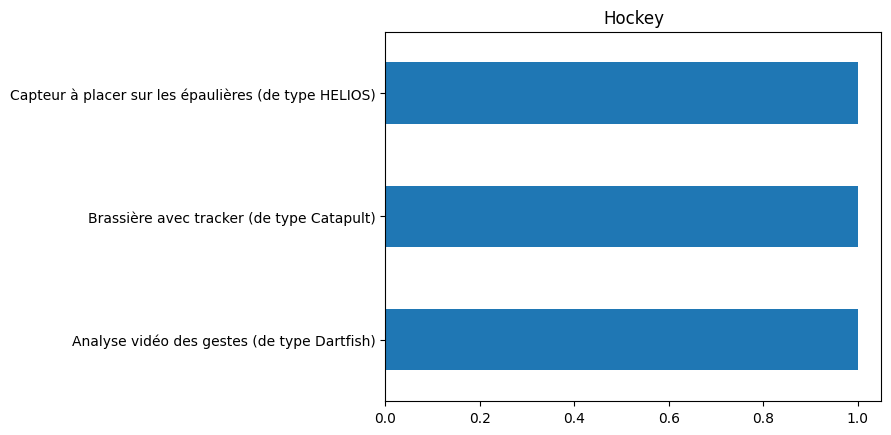

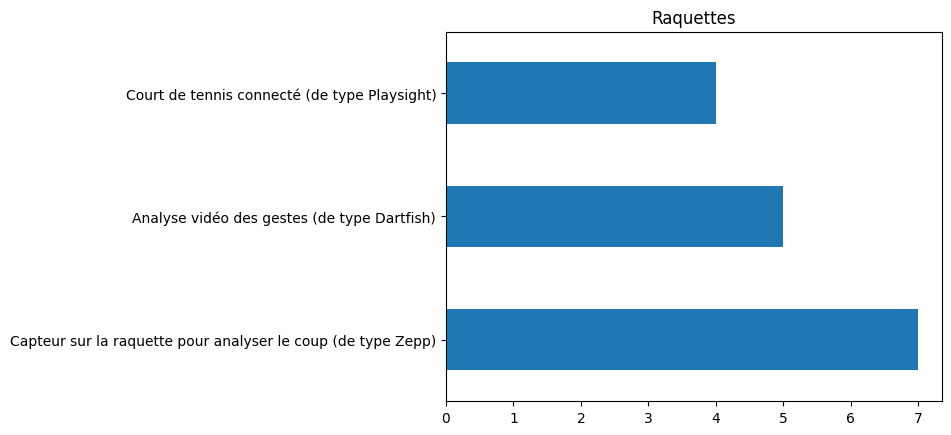

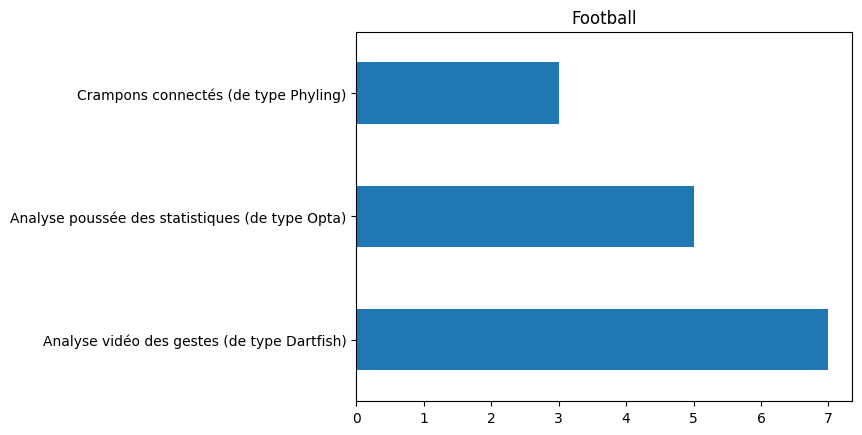

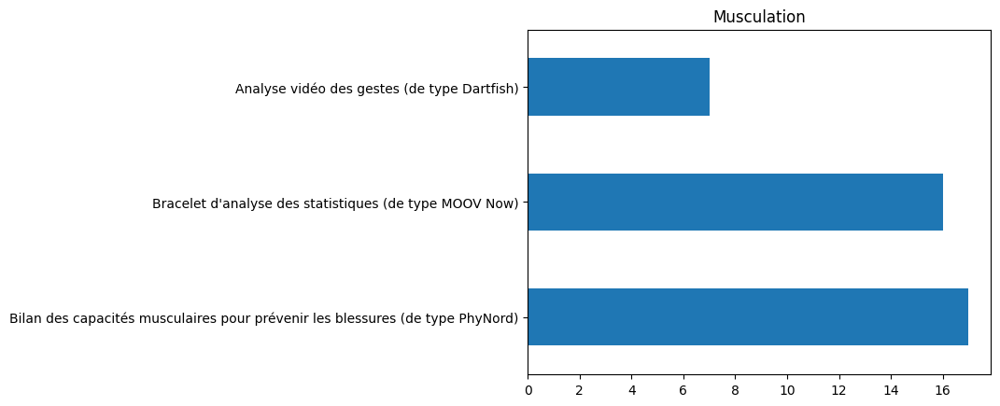

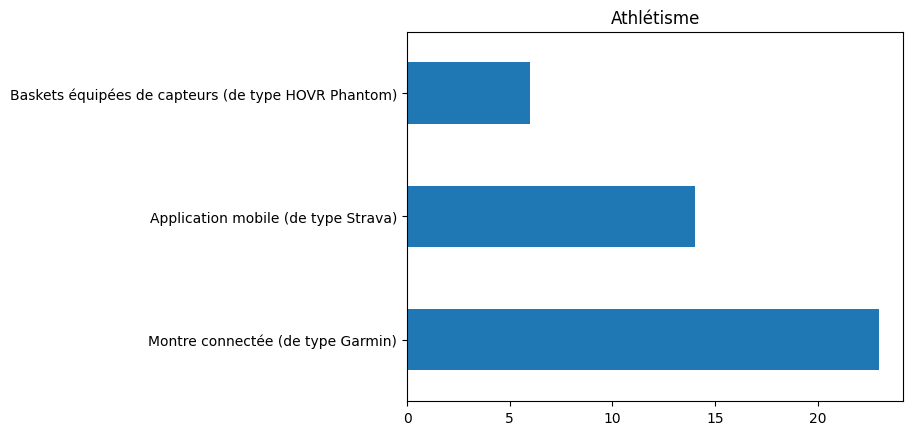

...

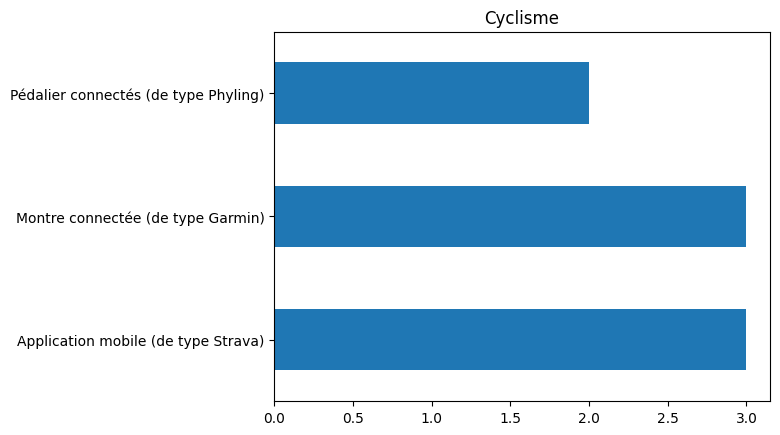

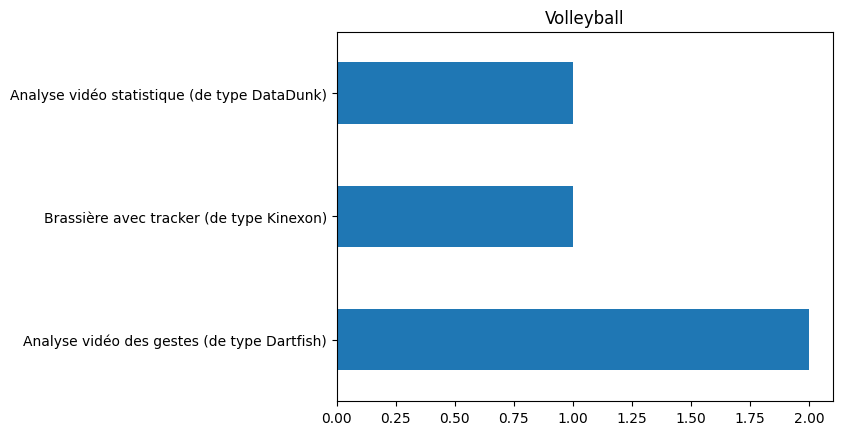

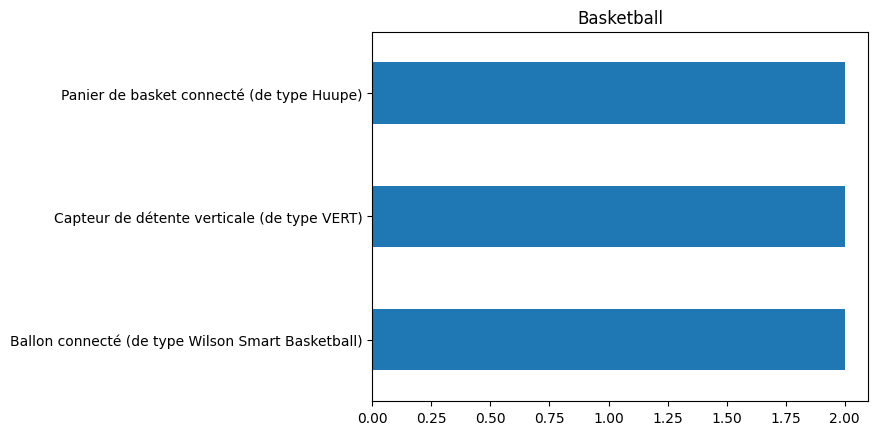

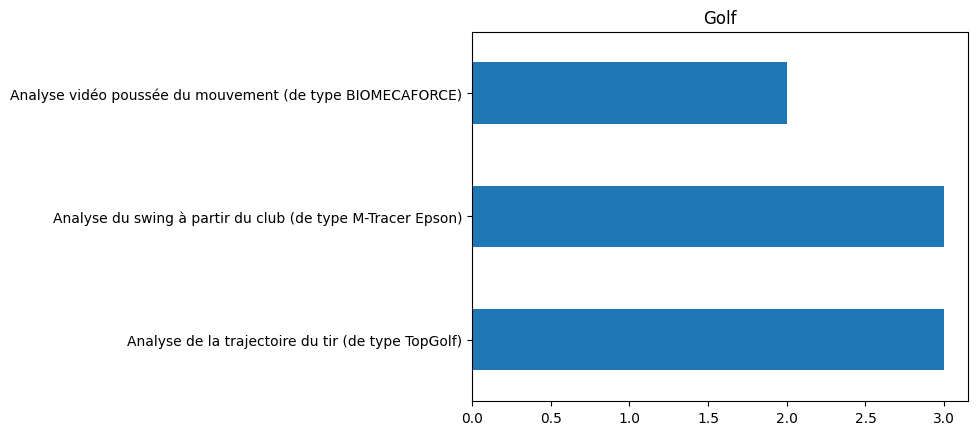

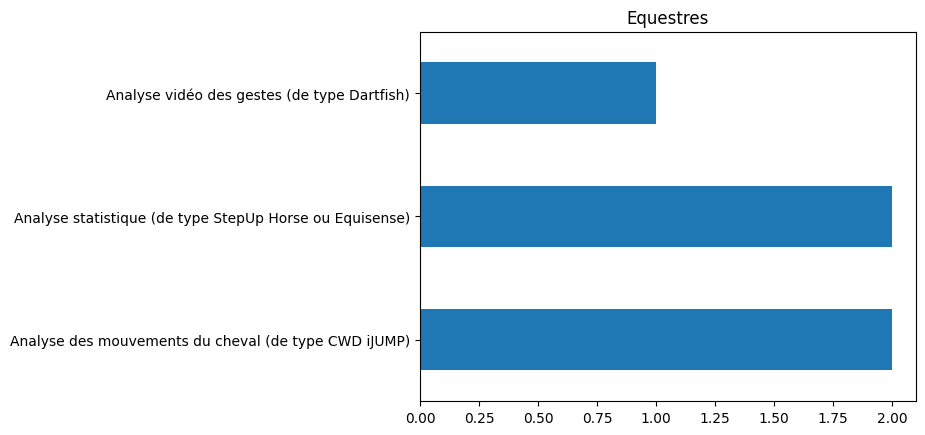

In [24]:
### Top 3 des appareils les plus utiles pour chaque sport
for sport in dictDF.keys():
    tempApp = countMultipleAppareils(dictDF[sport]['Appareils_Utiles'])
    tempDf = pd.DataFrame(data=tempApp.values(),columns=["count"],index=tempApp.keys())
    c =tempDf.sort_values(by='count',ascending=False).head(3)
    #print(c)
    c["count"].plot(kind='barh',title=sport)
    plt.show()

In [25]:
### Raison principale pour l'utilisation d'un appareil pour chaque sport
for k in dictDF.keys():
    dfTest = dictDF[k]
    tempDf = countMultipleSport(dfTest[dfTest.columns[4]])
    tempDf = raisonsNonMap(tempDf)
    tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
    c =tempDf.sort_values(by='count',ascending=False).head(1)
    print(k,":",c.index[0],"->",c["count"].iloc[0], "choix")

Hockey : Mon entraineur m'en a conseillé un -> 1 choix
Raquettes : Pouvoir améliorer mes performances -> 9 choix
Football : Pouvoir suivre mes performances -> 10 choix
Musculation : Pouvoir améliorer mes performances -> 18 choix
Athlétisme : Pouvoir suivre mes performances -> 26 choix
Hiver : Des amis l'utilisent -> 2 choix
Natation : Pouvoir suivre mes performances -> 6 choix
Rugby : Pouvoir améliorer mes performances -> 3 choix
Handball : Mon entraineur m'en a conseillé un -> 1 choix
Combat : Pouvoir suivre mes performances -> 4 choix
Cyclisme : Me motiver à pratiquer plus régulièrement mon sport -> 4 choix
Volleyball : Sur conseils de mon médecin pour une rééducation ou suivi médical -> 1 choix
Basketball : Des amis l'utilisent -> 1 choix
Golf : Pouvoir améliorer mes performances -> 3 choix
Equestres : Mon médecin m'en a conseillé un -> 1 choix


In [49]:
### Information qui revient le plus souvent pour chaque sport
infoListName = ["Montant_Abonnement","Montant_Achat","Complexe_Simple","Achat_Loc",
                "Quelle est votre tranche d'âge ?","Quelle est votre principale région de résidence ?",
                "Quel est votre secteur d'activité ?","Quelle est votre catégorie socio-professionnelle ?"]

for k in dictDF.keys():
    print("---------------------",k,"---------------------")
    for group in infoListName:     
        tempDf = dictDF[k].groupby(group).count().sort_values(by='count',ascending=False).iloc[:,1:2].head(1).index
        print(group,":",tempDf[0])

--------------------- Hockey ---------------------
Montant_Abonnement : 0-4,99 euros
Montant_Achat : 0-24 euros
Complexe_Simple : Complet mais complexe
Achat_Loc : Location
Quelle est votre tranche d'âge ? : 15-17 ans
Quelle est votre principale région de résidence ? : Île-de-France
Quel est votre secteur d'activité ? : Education
Quelle est votre catégorie socio-professionnelle ? : Etudiant
--------------------- Raquettes ---------------------
Montant_Abonnement : 0-4,99 euros
Montant_Achat : 50-99 euros
Complexe_Simple : Simplifié mais compréhensible
Achat_Loc : Achat
Quelle est votre tranche d'âge ? : 18-24 ans
Quelle est votre principale région de résidence ? : Île-de-France
Quel est votre secteur d'activité ? : Agroalimentaire
Quelle est votre catégorie socio-professionnelle ? : Etudiant
--------------------- Football ---------------------
Montant_Abonnement : 0-4,99 euros
Montant_Achat : 50-99 euros
Complexe_Simple : Simplifié mais compréhensible
Achat_Loc : Achat
Quelle est votre

'\nfor k in dictDF.keys():\n    print(k)\n    tempDf = dictDF[k].groupby(\'Montant_Abonnement\').count().sort_values(by=\'count\',ascending=False).iloc[:,1:2].head(1).index\n    print("Montant_Abonnement",":",tempDf[0])\n    #print(\'Montant_Achat\')\n    tempDf = dictDF[k].groupby(\'Montant_Achat\').count().sort_values(by=\'count\',ascending=False).iloc[:,1:2].head(1).index\n    print(k,":",tempDf[0])\n    tempDf = dictDF[k].groupby(\'Complexe_Simple\').count().sort_values(by=\'count\',ascending=False).iloc[:,1:2].head(1).index\n    print(k,":",tempDf[0])\n    try:\n        tempDf = dictDF[k].groupby(\'Achat_Loc\').count().sort_values(by=\'count\',ascending=False).iloc[:,1:2].head(1).index\n        print(k,":",tempDf[0])\n    except:\n        print("pas de loc")\n    tempDf = dictDF[k].groupby("Quelle est votre tranche d\'âge ?").count().sort_values(by=\'count\',ascending=False).iloc[:,1:2].head(1).index\n    print(k,":",tempDf[0])\n    tempDf = dictDF[k].groupby("Quelle est votre pri

In [27]:
### Mise en commun de tous les sports en un seul dataframe
tempAllDf = []
for i in dictDF.keys():
    tempAllDf.append(dictDF[i])
result = pd.concat(tempAllDf)
result.head()

,À quelle fréquence pratiquez-vous une activité sportive ?,count,Si non pour quelles raisons ?,Raisons,Qui serait votre principale influence à l'utilisation d'un appareil de suivi des performances ?,Quelle est votre tranche d'âge ?,Quelle est votre principale région de résidence ?,Quelle est votre catégorie socio-professionnelle ?,Quel est votre sport principal dans la liste ci-dessous ?,Quel est votre secteur d'activité ?,...,Obstacle_Inutile,Obstacle_Inconfort,Montant_Achat,Montant_Abonnement,"Lors de la pratique de votre sport, utilisez-vous un appareil de suivi de vos performances ? (montre connectée, capteur sur soi, application mobile, etc)","Est-ce que l'achat d'un appareil reconditionné / d'occasion, et donc moins cher, vous intéresserait ?",Complexe_Simple,Appareils_Utiles,Achat_Loc,Si oui quel(s) appareil(s) utilisez-vous ?
0,Régulièrement chaque semaine,0,Pas de connaissance sur l'existence d'un appar...,"Pouvoir améliorer mes performances, Pouvoir co...",Mon entraineur m'en a conseillé un,15-17 ans,Île-de-France,Etudiant,Hockey,Education,...,2.0,2.0,0-24 euros,"0-4,99 euros",Non,"Peut-être, cela dépend de l'état du produit",Complet mais complexe,"Analyse vidéo des gestes (de type Dartfish), B...",Location,NaN
1,Régulièrement chaque semaine,0,Pas de connaissance sur l'existence d'un appar...,"Pouvoir suivre mes performances, Pouvoir améli...",Mon entraineur m'en a conseillé un,18-24 ans,Île-de-France,Etudiant,Raquettes,Informatique / Télécom,...,2.0,4.0,25-49 euros,"0-4,99 euros",Non,"Peut-être, cela dépend de l'état du produit",Complet mais complexe,"Analyse vidéo des gestes (de type Dartfish), B...",NaN,NaN
6,Régulièrement chaque mois,0,Pas utile à mon niveau de pratique du sport,Pouvoir améliorer mes performances,Des sportifs professionnels que j'apprécie l'u...,18-24 ans,Île-de-France,Etudiant,Raquettes,Industrie,...,1.0,1.0,50-99 euros,"0-4,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Complet mais complexe,"Analyse vidéo des gestes (de type Dartfish), B...",Achat,NaN
27,Régulièrement chaque semaine,0,NaN,"Pouvoir suivre mes performances, Pouvoir améli...",Des amis l'utilisent,18-24 ans,Normandie,Etudiant,Raquettes,Agroalimentaire,...,3.0,2.0,50-99 euros,"0-4,99 euros",Oui,"Oui, s'il fonctionne c'est le principal",Simplifié mais compréhensible,"Analyse vidéo des gestes (de type Dartfish), A...",Achat,Montre garmin
29,Occasionnellement,0,Connaissance d'un appareil utile mais trop cher,"Pouvoir suivre mes performances, Pouvoir améli...",Mon médecin m'en a conseillé un,18-24 ans,Île-de-France,Etudiant,Raquettes,Communication / Marketing,...,3.0,2.0,50-99 euros,"0-4,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Simplifié mais compréhensible,Capteur sur la raquette pour analyser le coup ...,Achat,NaN


<Axes: title={'center': 'Motivations'}, ylabel='Motivations'>

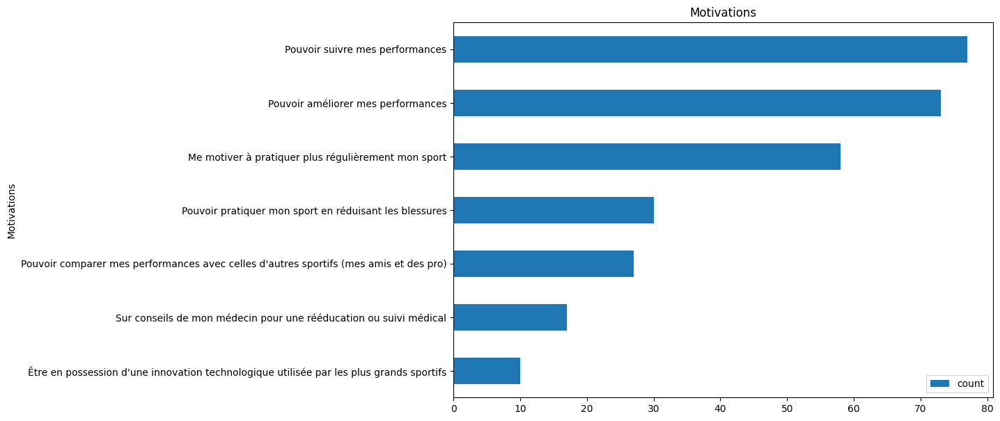

In [28]:
### Raisons pour l'utilisation d'un appareil pour tous les sports
tempDf = countMultiple(result['Raisons'])
tempDf = raisonsOuiMap(tempDf)
tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
tempDf.sort_values(by='count',ascending=True).plot(kind='barh',figsize=(10,7),title="Motivations",ylabel="Motivations")

<Axes: title={'center': 'Du plus important au moins important'}>

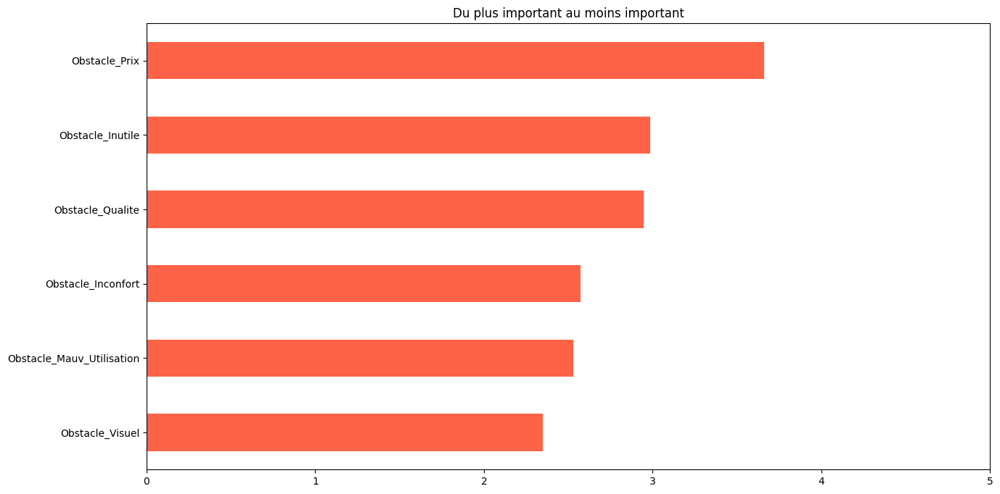

In [29]:
### Obstacles à l'utilisation d'un appareil pour tous les sports
dfObs = result[['Obstacle_Qualite','Obstacle_Prix','Obstacle_Mauv_Utilisation','Obstacle_Inutile','Obstacle_Inconfort','Obstacle_Visuel']]
dfObs.mean().sort_values(ascending=True).plot(xlim=[0,5],kind='barh',figsize=(15,8),title="Du plus important au moins important",color='tomato')

<Axes: title={'center': 'Appareils Utiles'}, ylabel='Obstacles'>

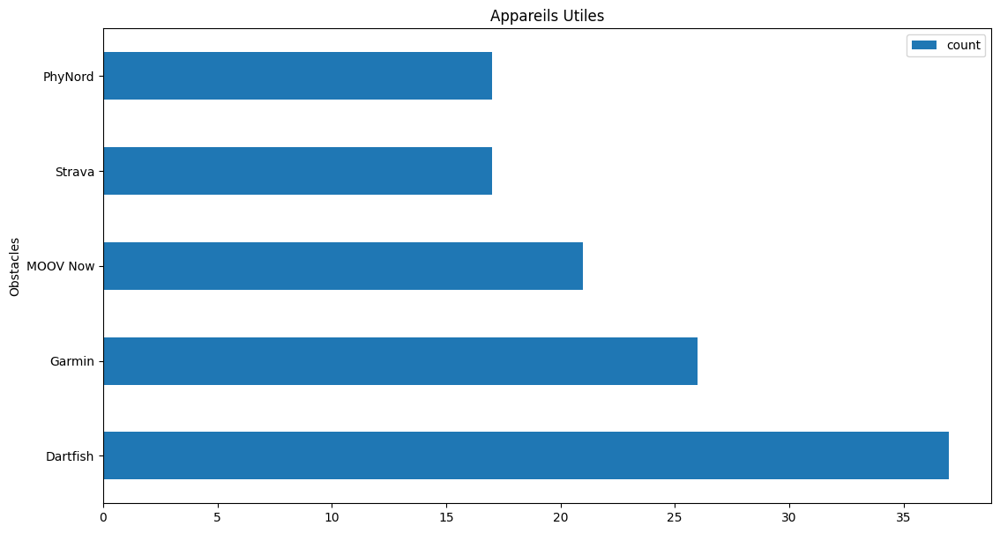

In [30]:
### Top 5 des appareils les plus demandés pour tous les sports
tempDf = getParVal(countMultiple(result['Appareils_Utiles']))
tempDf = pd.DataFrame(data=tempDf.values(),columns=["count"],index=tempDf.keys())
tempDf.sort_values(by='count',ascending=False).head().plot(kind='barh',figsize=(13,7),title="Appareils Utiles",ylabel="Obstacles")

In [31]:
tempDf.sort_values(by='count',ascending=False)

,count
Dartfish,37
Garmin,26
MOOV Now,21
Strava,17
PhyNord,17
TechnoSport d’Aix-Marseille,9
STATSport ou Catapult,8
Phyling,7
PhyLift,7
Zepp,7


<Axes: title={'center': 'Montant Achat'}, ylabel='Montant'>

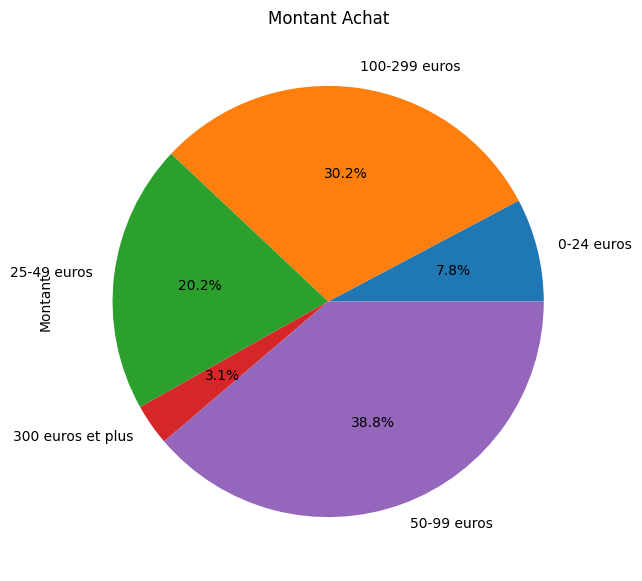

In [32]:
dfObs=result.groupby('Montant_Achat').count()#.sort_values(by='Genre',ascending=False)
dfObs['count'].plot(kind="pie",figsize=(figWeight,figHeight),title="Montant Achat",ylabel='Montant',autopct='%1.1f%%')

<Axes: title={'center': 'Montant Abonnement'}, ylabel='Montant'>

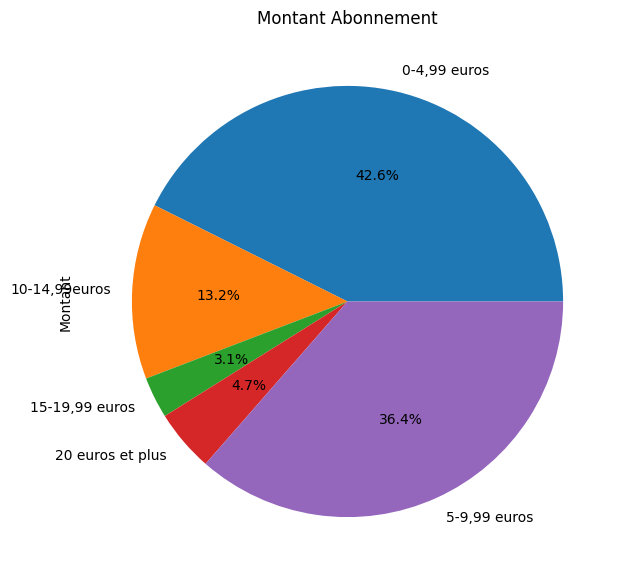

In [33]:
dfObs=result.groupby('Montant_Abonnement').count()#.sort_values(by='count',ascending=True)
dfObs['count'].plot(kind="pie",figsize=(figWeight,figHeight),title="Montant Abonnement",ylabel='Montant',autopct='%1.1f%%')

<Axes: title={'center': 'Complexité appareil'}, ylabel='Complexité'>

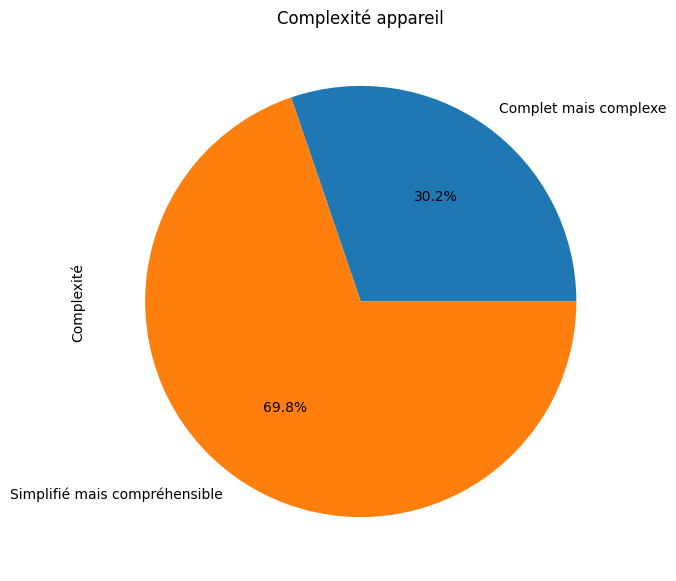

In [34]:
dfObs=result.groupby('Complexe_Simple').count()#.sort_values(by='count',ascending=False)
dfObs['count'].plot(kind="pie",figsize=(figWeight,figHeight),title="Complexité appareil",ylabel='Complexité',autopct='%1.1f%%')

<Axes: title={'center': 'Achat ou Location'}, ylabel='Achat/Location'>

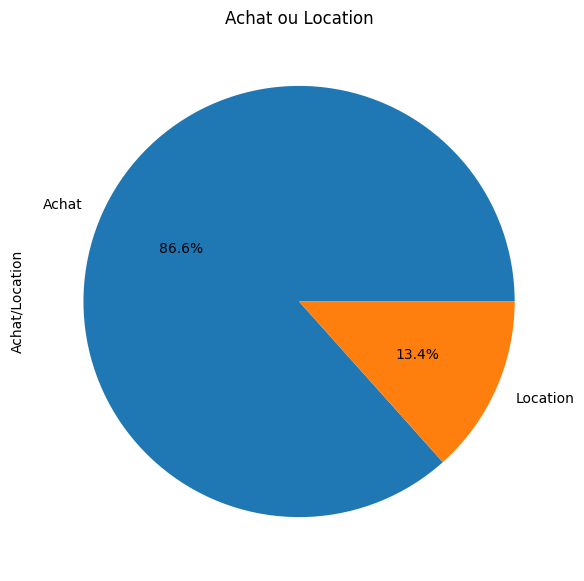

In [35]:
dfObs=result.groupby('Achat_Loc').count()#.sort_values(by='Genre',ascending=False)
dfObs['count'].plot(kind="pie",figsize=(figWeight,figHeight),title="Achat ou Location",ylabel='Achat/Location',autopct='%1.1f%%')

### Analyse par Age

In [36]:
#Colonnes à analyser
statNames = ["Montant_Abonnement","Montant_Achat",
             "Qui serait votre principale influence à l'utilisation d'un appareil de suivi des performances ?",
             "Préfèreriez-vous avoir votre propre appareil, ou bien utiliser un appareil présent directement à l'endroit où vous pratiquer votre sport ?",
             "Est-ce que l'achat d'un appareil reconditionné / d'occasion, et donc moins cher, vous intéresserait ?",
             "Complexe_Simple","Achat_Loc",
             "Quel est votre sport principal dans la liste ci-dessous ?"]

Il y a eu 9 réponses pour l'âge 15-17 ans
Il y a eu 52 réponses pour l'âge 18-24 ans
Il y a eu 15 réponses pour l'âge 55 ans et plus
Il y a eu 23 réponses pour l'âge 45-55 ans
Il y a eu 19 réponses pour l'âge 25-34 ans
Il y a eu 11 réponses pour l'âge 35-44 ans


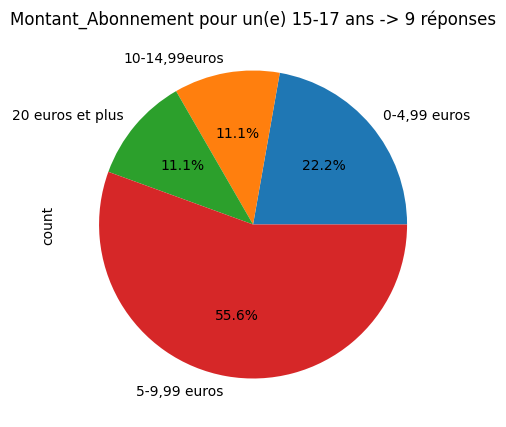

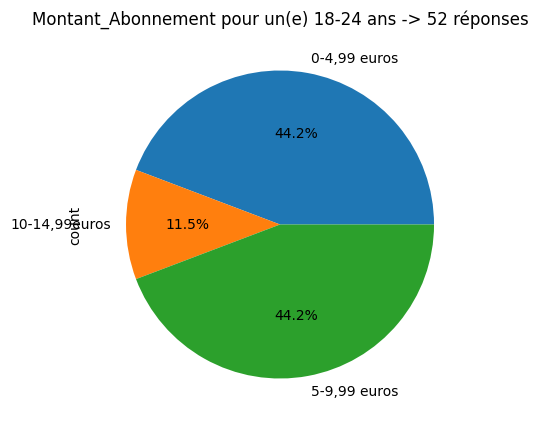

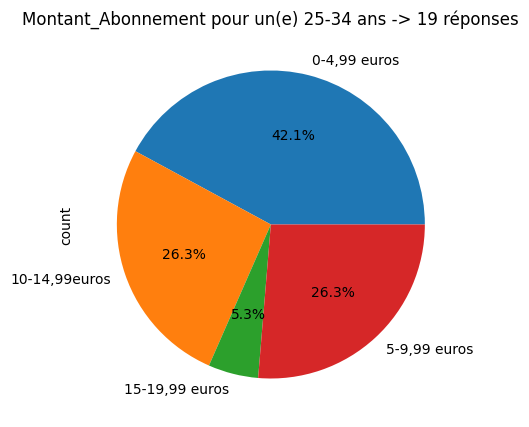

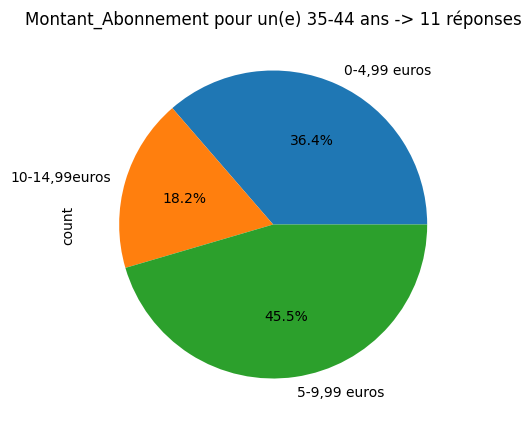

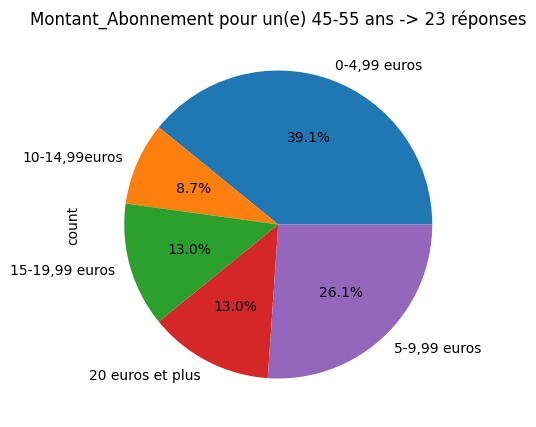

...

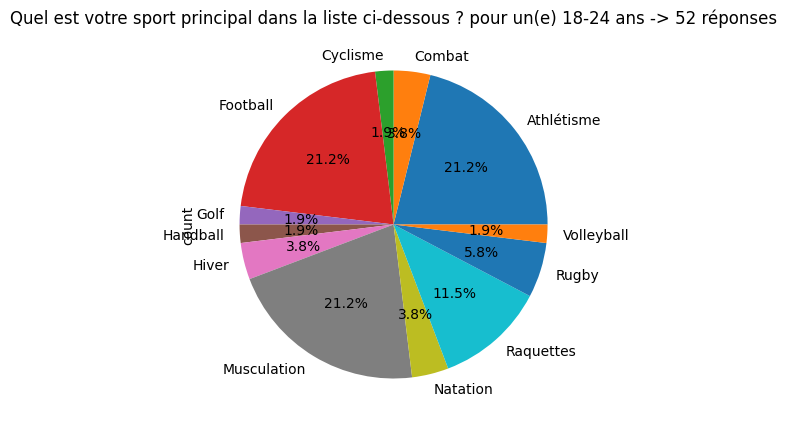

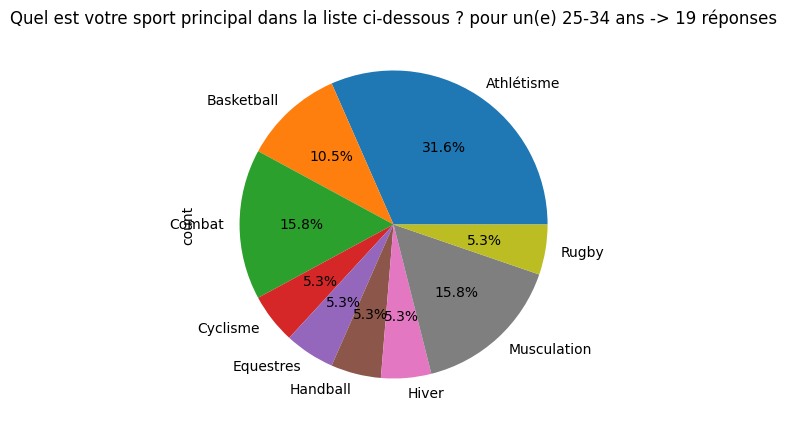

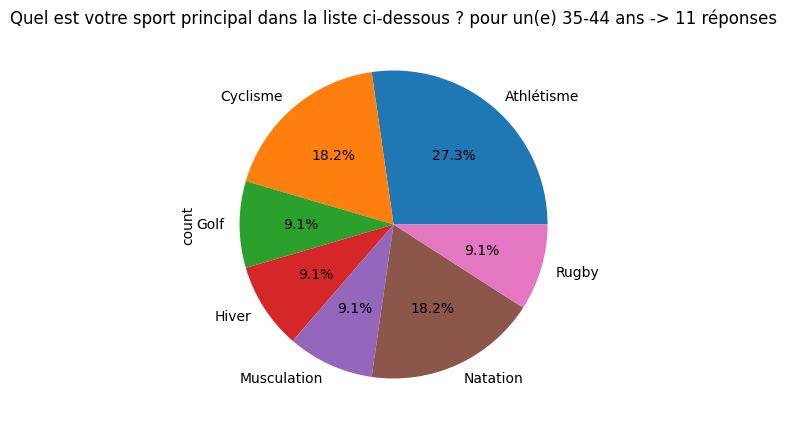

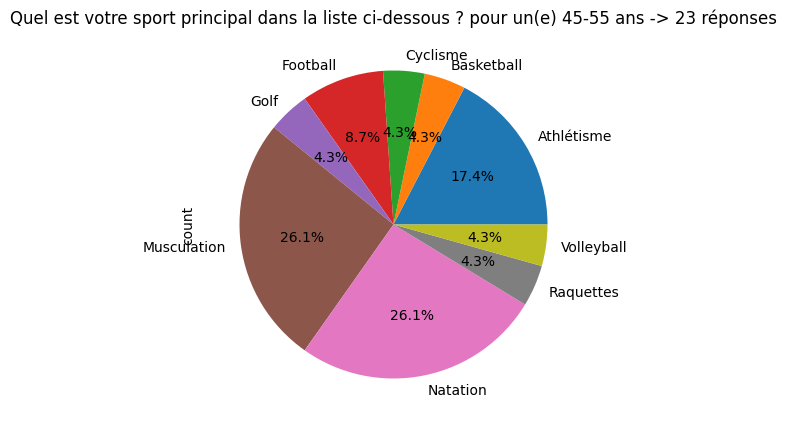

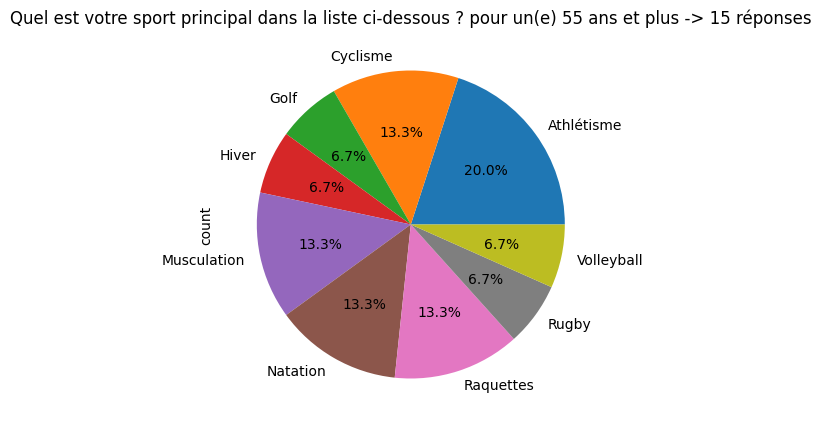

In [37]:
ages = {}
for i in range (len(result)):
    tempAge = result["Quelle est votre tranche d'âge ?"].iloc[i]
    if(tempAge not in ages):
        ages[tempAge] = 1
    else:
        ages[tempAge]+=1

ageDict ={}
for curAges in ages.keys():
    ageDict[curAges] = result[result["Quelle est votre tranche d'âge ?"]==curAges]
    ageDict[curAges].dropna(axis=1,inplace=True,how='all')
    renameCol(ageDict[curAges])
    ageDict[curAges].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(ageDict[curAges])} réponses pour l'âge {curAges}")
    
ageDict = dict(sorted(ageDict.items()))

#Graph    
for stat in statNames:
    for k in ageDict.keys():
        ageDict[k].groupby(by=stat).count().plot(kind='pie',y='count',figsize=(5,5),title=f"{stat} pour un(e) {k} -> {len(ageDict[k])} réponses",autopct='%1.1f%%',legend=False)

### Analyse par genre

Il y a eu 66 réponses pour le genre Homme
Il y a eu 60 réponses pour le genre Femme
Il y a eu 3 réponses pour le genre Je ne souhaite pas le préciser
Suppression des données de moins de 10
Suppression de : Je ne souhaite pas le préciser


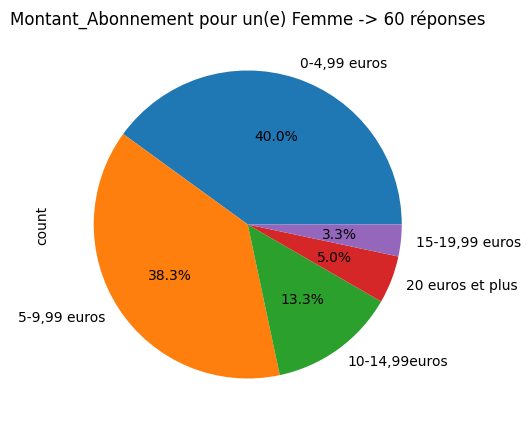

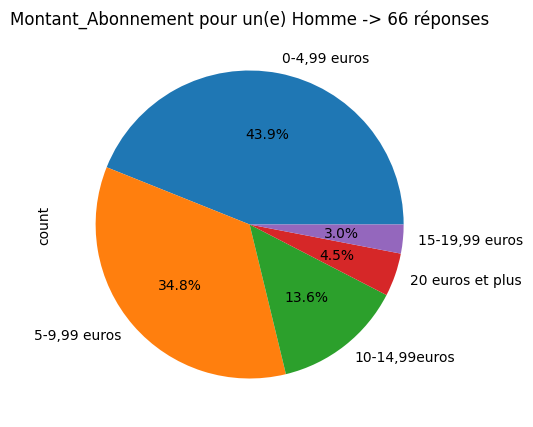

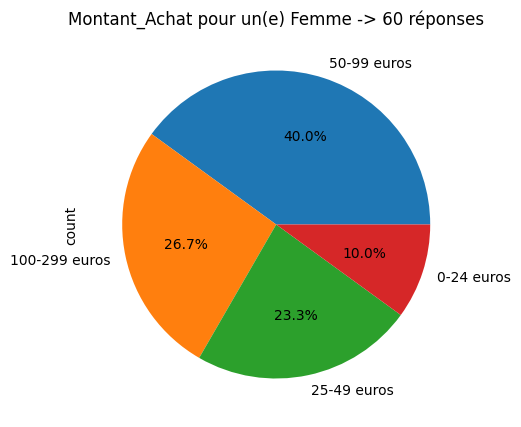

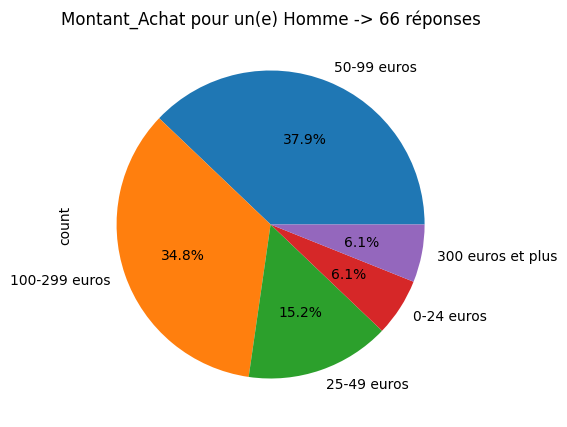

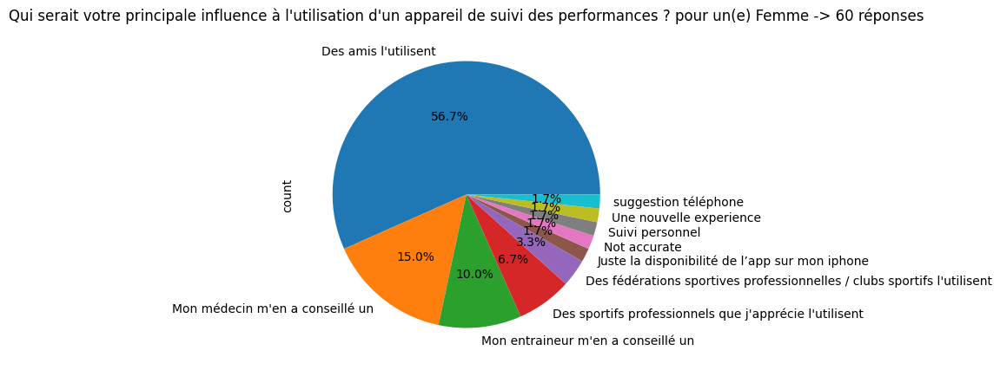

...

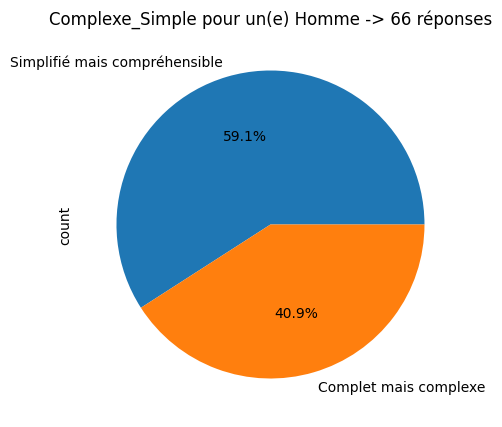

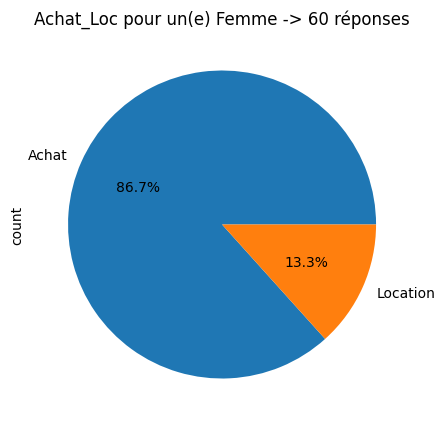

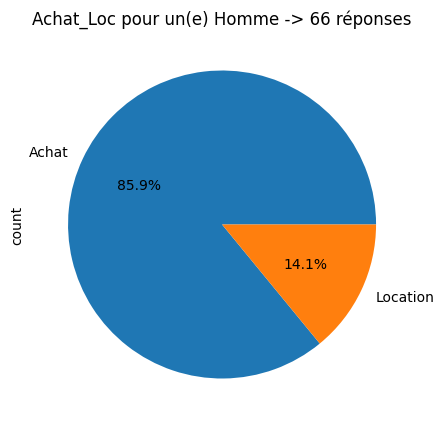

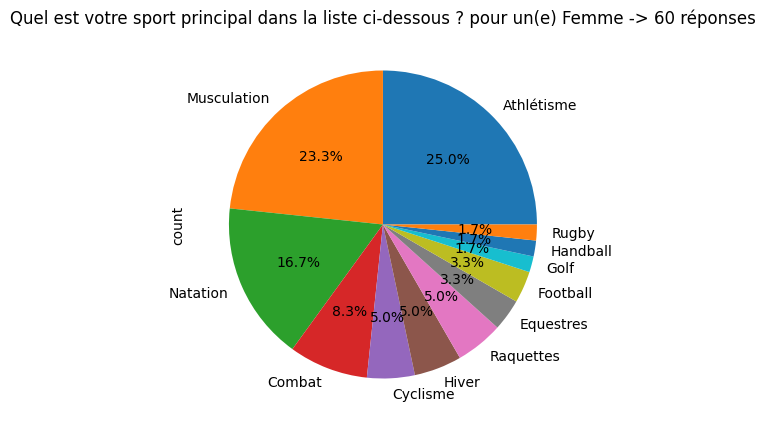

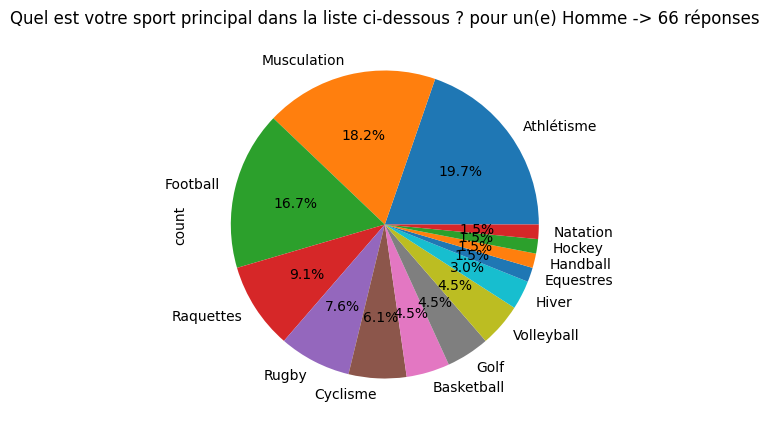

In [38]:
genres = {}
for i in range (len(result)):
    tempGenre = result["Quel est votre genre ?"].iloc[i]
    if(tempGenre not in genres):
        genres[tempGenre] = 1
    else:
        genres[tempGenre]+=1

genreDict ={}
for curgenres in genres.keys():
    genreDict[curgenres] = result[result["Quel est votre genre ?"]==curgenres]
    genreDict[curgenres].dropna(axis=1,inplace=True,how='all')
    renameCol(genreDict[curgenres])
    genreDict[curgenres].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(genreDict[curgenres])} réponses pour le genre {curgenres}")
    
genreDict = dict(sorted(genreDict.items()))
        
delList=[]
minNb = 10
for k in genreDict.keys():
    if(len(genreDict[k])<=minNb):delList.append(k)
      
print("Suppression des données de moins de",minNb)
for i in delList:
    print("Suppression de :",i)
    del genreDict[i]
    
#Graph    
for stat in statNames:
    for k in genreDict.keys():
        genreDict[k].groupby(by=stat).count().sort_values(by='count',ascending=False).plot(kind='pie',y='count',figsize=(5,5),title=f"{stat} pour un(e) {k} -> {len(genreDict[k])} réponses",autopct='%1.1f%%',legend=False)

### Analyse par lieu

Il y a eu 67 réponses pour le lieu Île-de-France
Il y a eu 1 réponses pour le lieu Normandie
Il y a eu 1 réponses pour le lieu Uae
Il y a eu 3 réponses pour le lieu Suisse
Il y a eu 7 réponses pour le lieu Auvergne Rhône-Alpes
Il y a eu 9 réponses pour le lieu Liban
Il y a eu 9 réponses pour le lieu Occitanie
Il y a eu 5 réponses pour le lieu Bretagne
Il y a eu 5 réponses pour le lieu Provence-Alpes Côte d'Azur
Il y a eu 4 réponses pour le lieu Hauts-de-France
Il y a eu 8 réponses pour le lieu Bourgogne Franche-Comté
Il y a eu 1 réponses pour le lieu Other country
Il y a eu 2 réponses pour le lieu Kuwait
Il y a eu 3 réponses pour le lieu Nouvelle-Aquitaine
Il y a eu 1 réponses pour le lieu Pays de la Loire
Il y a eu 1 réponses pour le lieu Centre-Val de Loire
Il y a eu 1 réponses pour le lieu Paris
Il y a eu 1 réponses pour le lieu Tunisie 
Suppression des données de moins de 6


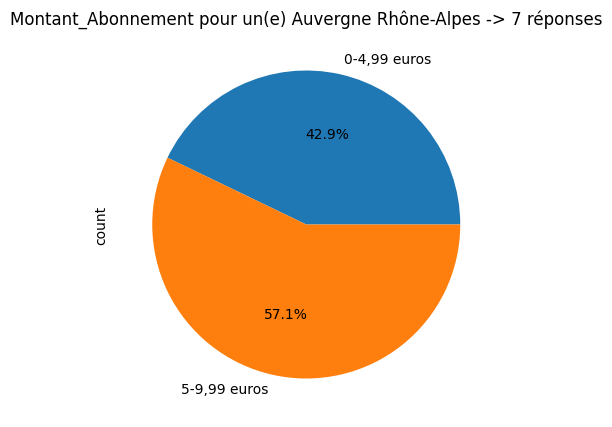

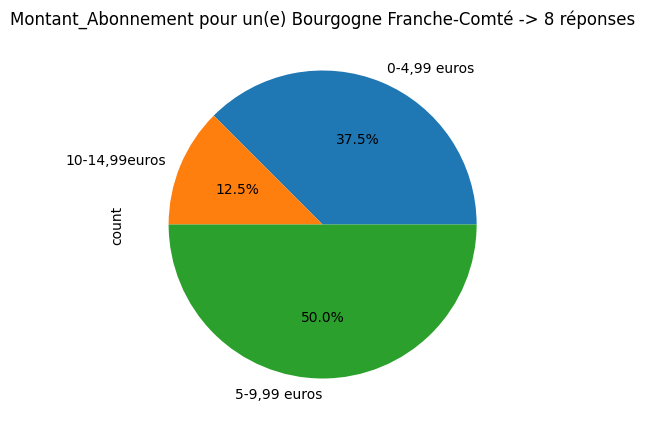

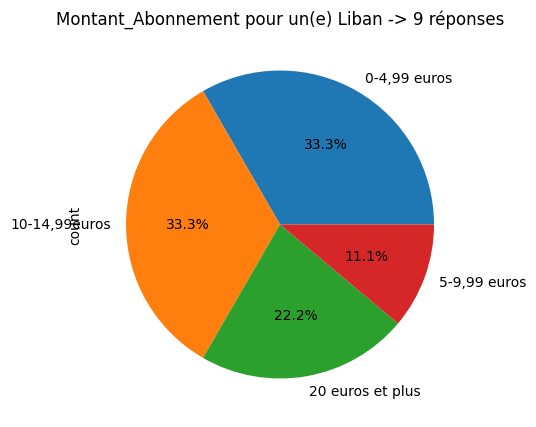

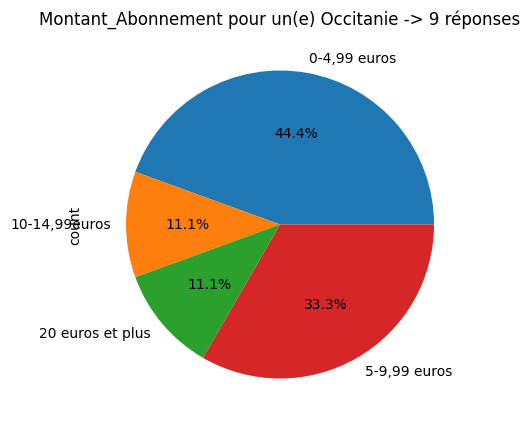

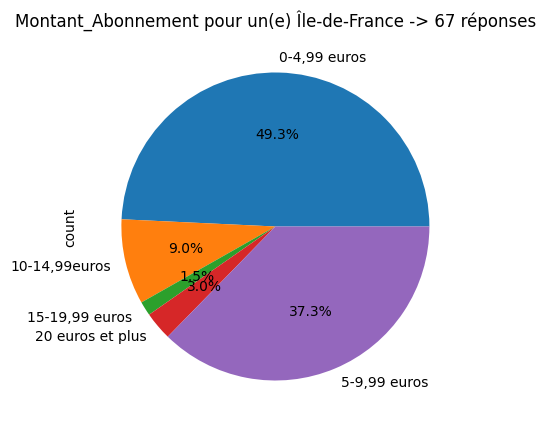

...

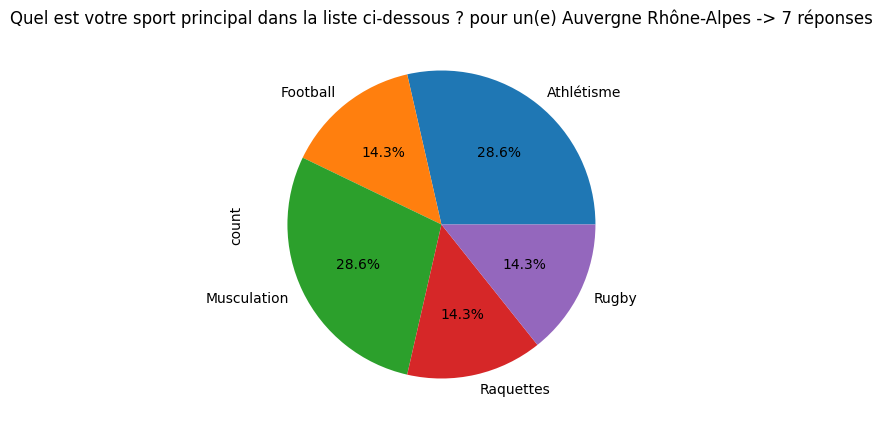

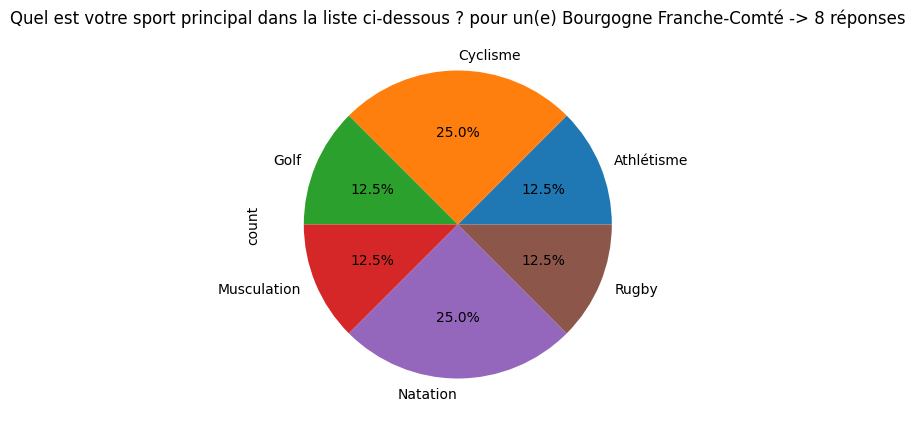

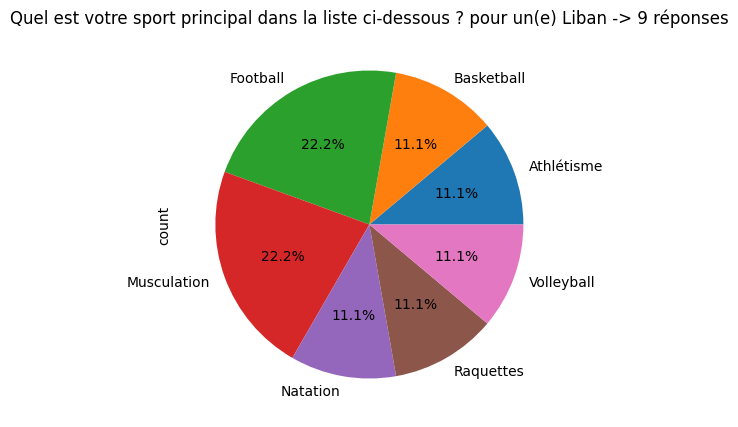

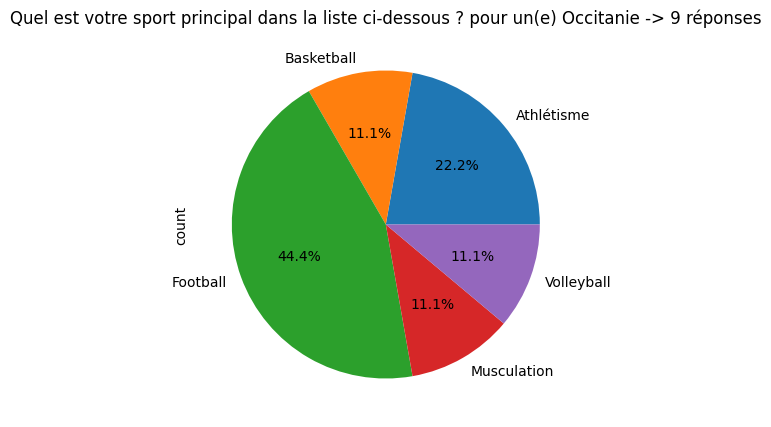

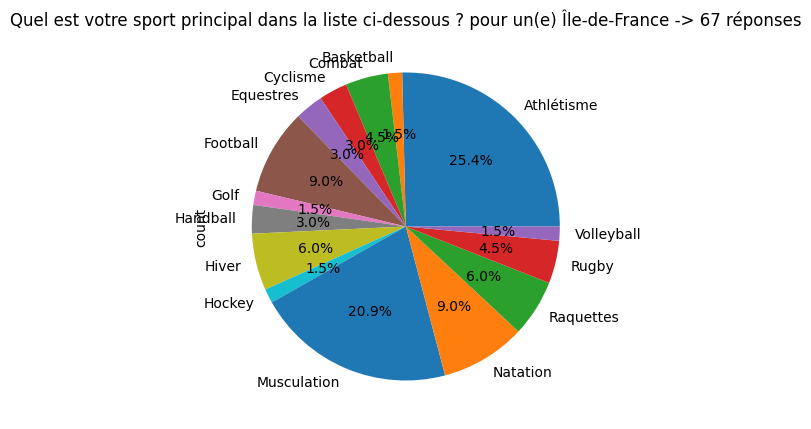

In [39]:
lieux = {}
for i in range (len(result)):
    tempLieu = result["Quelle est votre principale région de résidence ?"].iloc[i]
    if(tempLieu not in lieux):
        lieux[tempLieu] = 1
    else:
        lieux[tempLieu]+=1

lieuDict ={}
for curLieu in lieux.keys():
    lieuDict[curLieu] = result[result["Quelle est votre principale région de résidence ?"]==curLieu]
    lieuDict[curLieu].dropna(axis=1,inplace=True,how='all')
    renameCol(lieuDict[curLieu])
    lieuDict[curLieu].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(lieuDict[curLieu])} réponses pour le lieu {curLieu}")
    
lieuDict = dict(sorted(lieuDict.items()))

delList=[]
minNb = 6
for k in lieuDict.keys():
    if(len(lieuDict[k])<=minNb):delList.append(k)
      
print("Suppression des données de moins de",minNb)
for i in delList:
    #print("Suppression de :",i)
    del lieuDict[i]
    
#Graph
for stat in statNames:
    for k in lieuDict.keys():
        lieuDict[k].groupby(by=stat).count().plot(kind='pie',y='count',figsize=(5,5),title=f"{stat} pour un(e) {k} -> {len(lieuDict[k])} réponses",autopct='%1.1f%%',legend=False)

### Analyse par catégorie socio-professionnelle ?

Il y a eu 48 réponses pour le lieu Etudiant
Il y a eu 8 réponses pour le lieu Retraité
Il y a eu 24 réponses pour le lieu Employé
Il y a eu 8 réponses pour le lieu Enseignant
Il y a eu 26 réponses pour le lieu Cadre
Il y a eu 2 réponses pour le lieu Militaire
Il y a eu 2 réponses pour le lieu Parent au foyer
Il y a eu 3 réponses pour le lieu Demandeur d'emploi
Il y a eu 2 réponses pour le lieu Artisan / Commerçant
Il y a eu 1 réponses pour le lieu Saisonnier
Il y a eu 2 réponses pour le lieu Profession intérimaire
Il y a eu 1 réponses pour le lieu Architecte d'interieur
Il y a eu 1 réponses pour le lieu Agriculteur
Il y a eu 1 réponses pour le lieu Chef d'entreprise
Suppression des données de moins de 5


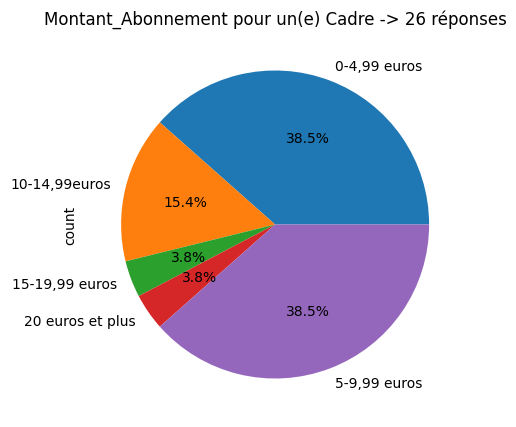

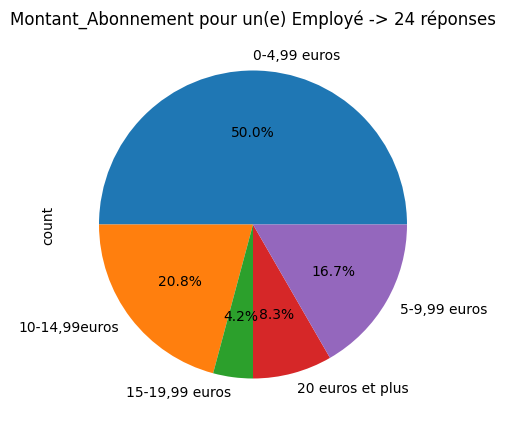

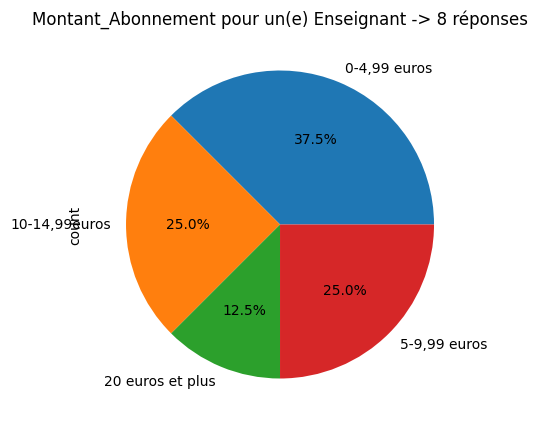

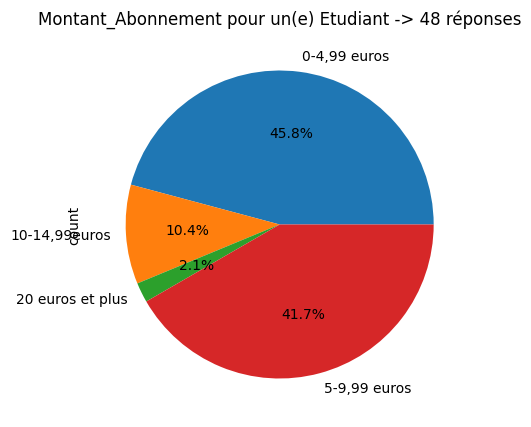

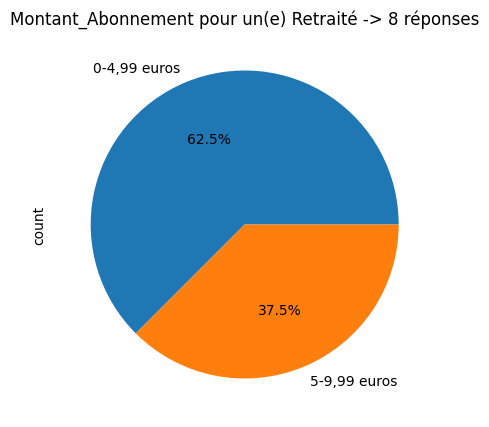

...

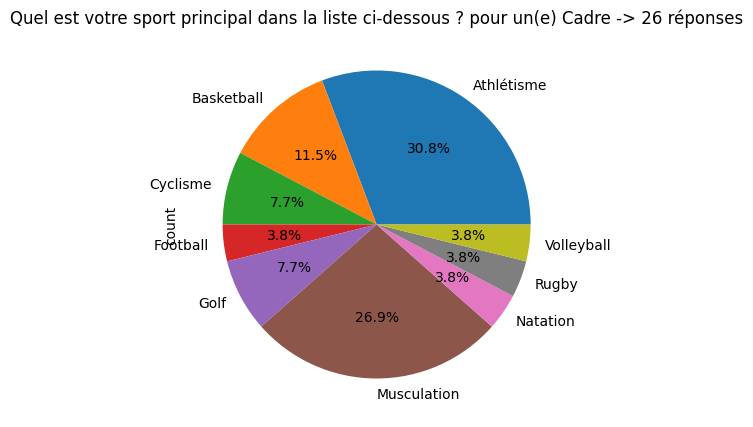

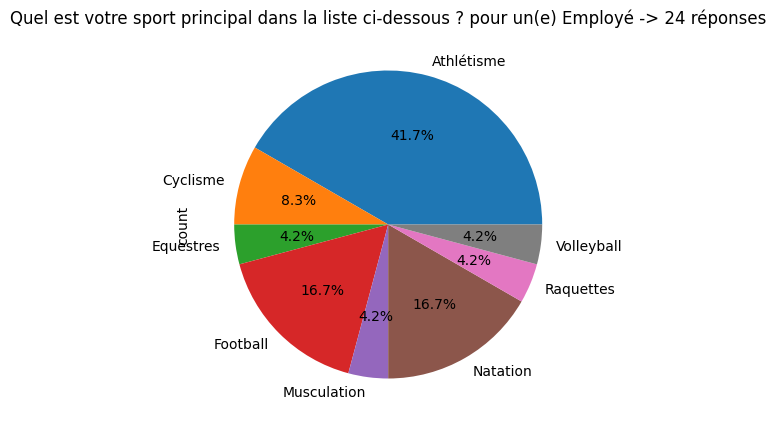

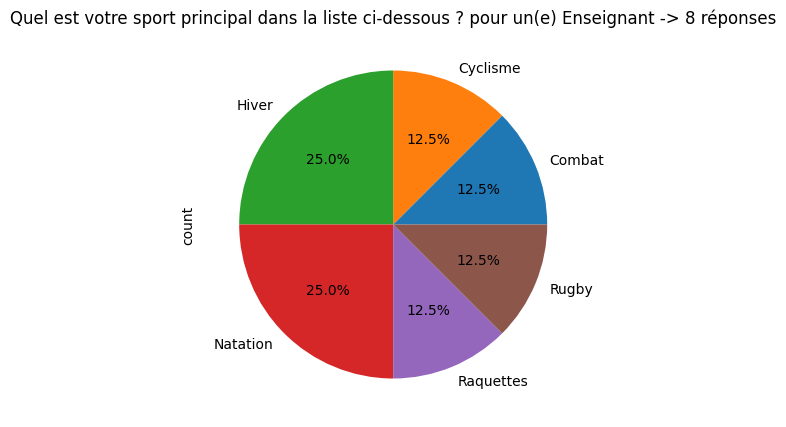

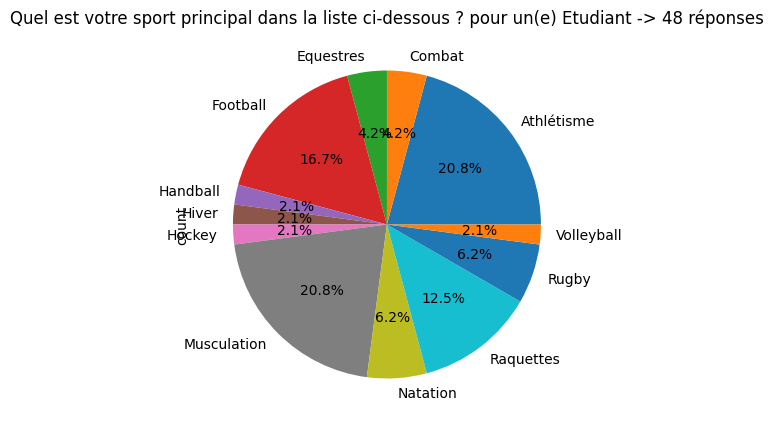

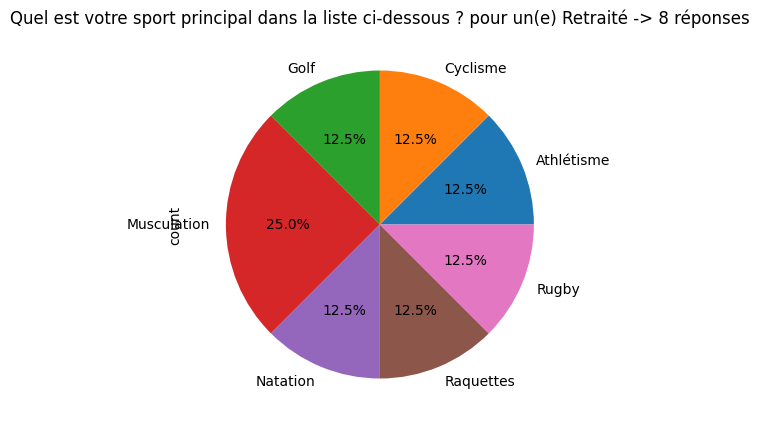

In [40]:
cats = {}
for i in range (len(result)):
    tempCat = result["Quelle est votre catégorie socio-professionnelle ?"].iloc[i]
    if(tempCat not in cats):
        cats[tempCat] = 1
    else:
        cats[tempCat]+=1

catDict ={}
for curCat in cats.keys():
    catDict[curCat] = result[result["Quelle est votre catégorie socio-professionnelle ?"]==curCat]
    catDict[curCat].dropna(axis=1,inplace=True,how='all')
    renameCol(catDict[curCat])
    catDict[curCat].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(catDict[curCat])} réponses pour le lieu {curCat}")
    
catDict = dict(sorted(catDict.items()))

delList=[]
minNb = 5
for k in catDict.keys():
    if(len(catDict[k])<=minNb):delList.append(k)
      
print("Suppression des données de moins de",minNb)
for i in delList:
    #print("Suppression de :",i)
    del catDict[i]
    
#Graph
for stat in statNames:
    for k in catDict.keys():
        catDict[k].groupby(by=stat).count().plot(kind='pie',y='count',figsize=(5,5),title=f"{stat} pour un(e) {k} -> {len(catDict[k])} réponses",autopct='%1.1f%%',legend=False)

### Analyse par fréquence

Il y a eu 78 réponses pour le lieu Régulièrement chaque semaine
Il y a eu 22 réponses pour le lieu Régulièrement chaque mois
Il y a eu 16 réponses pour le lieu Occasionnellement
Il y a eu 13 réponses pour le lieu Plutôt rarement
Suppression des données de moins de 5


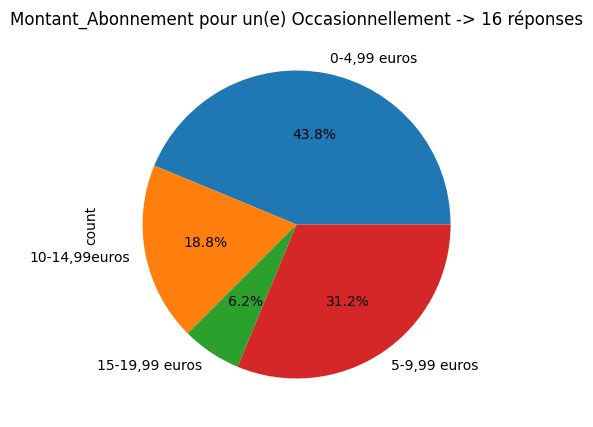

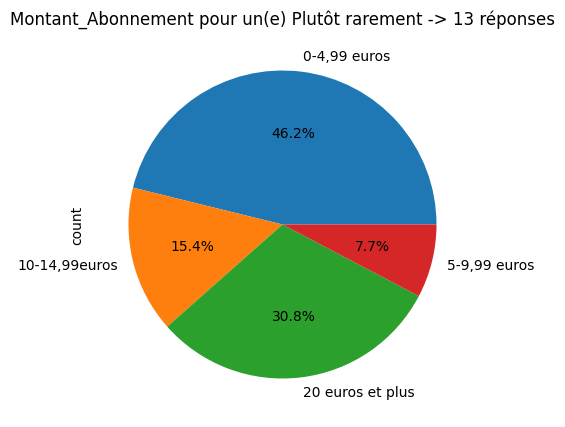

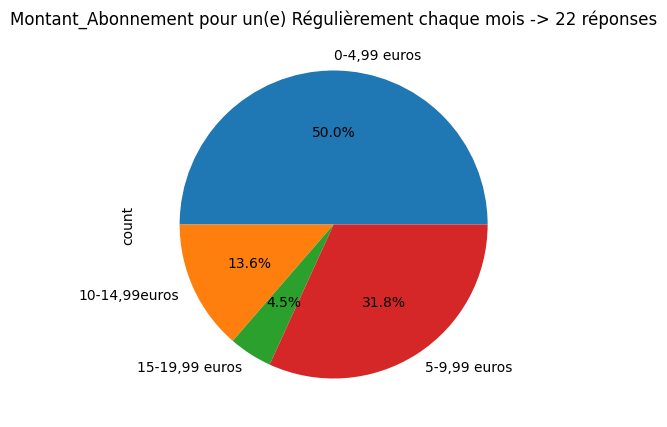

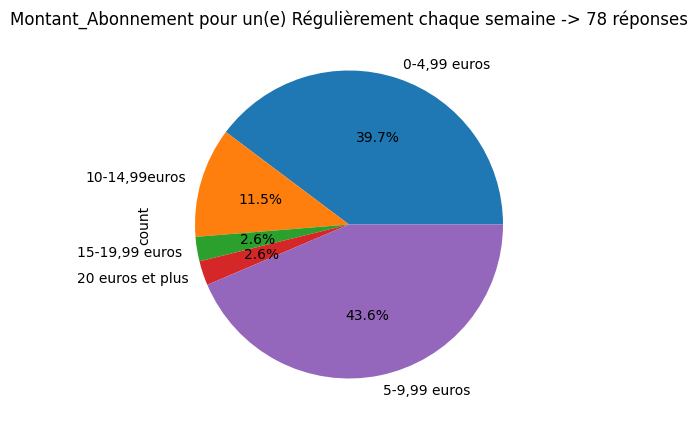

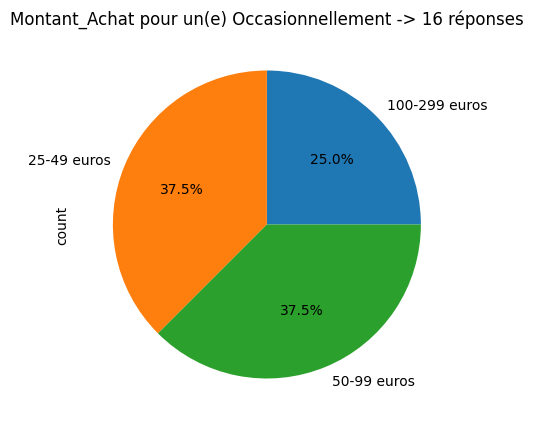

...

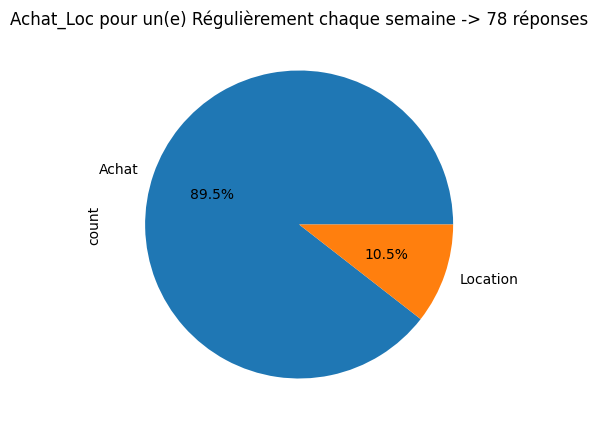

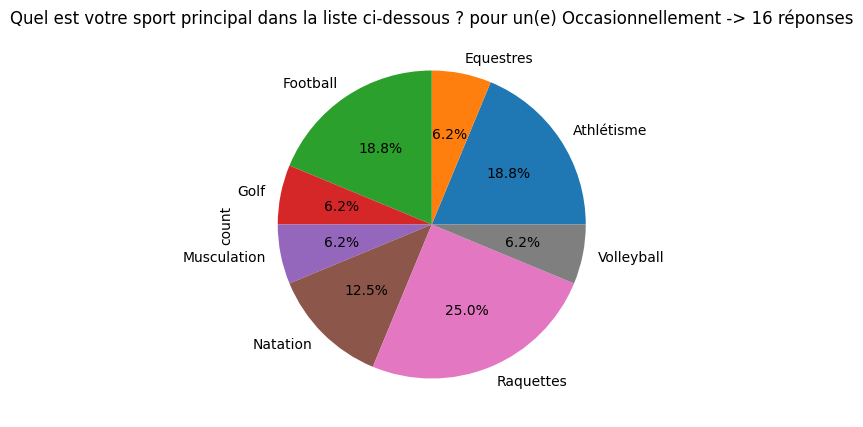

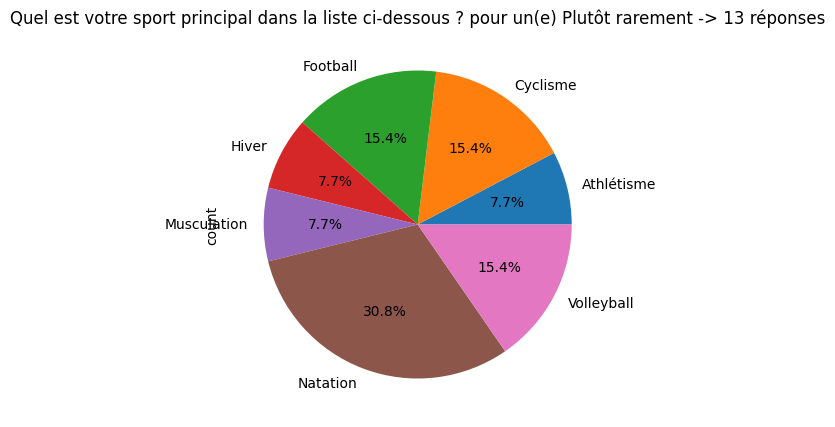

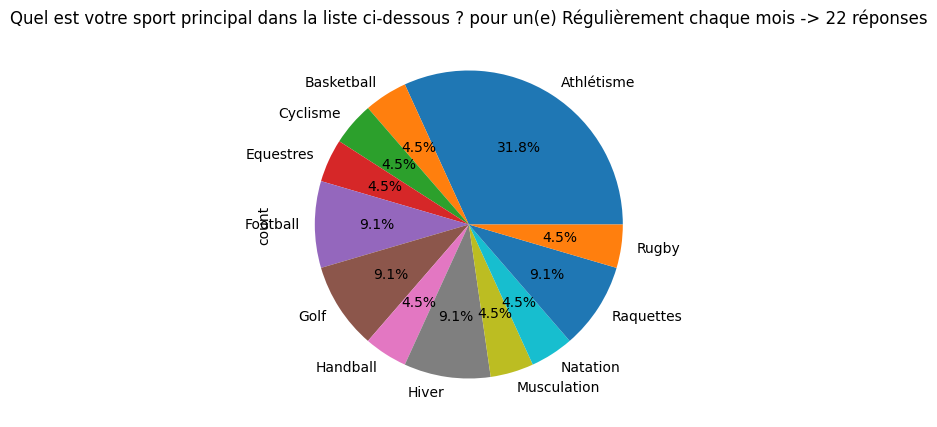

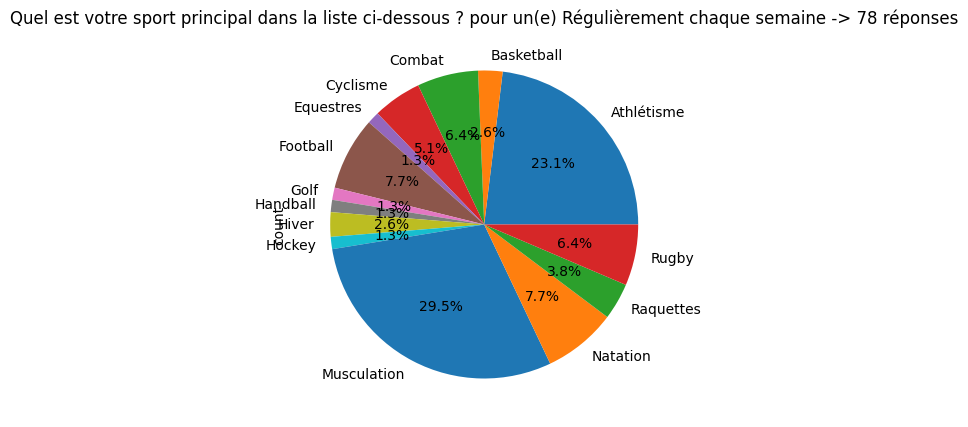

In [41]:
freq = {}
for i in range (len(result)):
    tempCat = result["À quelle fréquence pratiquez-vous une activité sportive ?"].iloc[i]
    if(tempCat not in freq):
        freq[tempCat] = 1
    else:
        freq[tempCat]+=1

freqDict ={}
for curFreq in freq.keys():
    freqDict[curFreq] = result[result["À quelle fréquence pratiquez-vous une activité sportive ?"]==curFreq]
    freqDict[curFreq].dropna(axis=1,inplace=True,how='all')
    renameCol(freqDict[curFreq])
    freqDict[curFreq].sort_index(axis=1, ascending=False,inplace=True)
    print(f"Il y a eu {len(freqDict[curFreq])} réponses pour le lieu {curFreq}")
    
freqDict = dict(sorted(freqDict.items()))

delList=[]
minNb = 5
for k in freqDict.keys():
    if(len(freqDict[k])<=minNb):delList.append(k)
      
print("Suppression des données de moins de",minNb)
for i in delList:
    #print("Suppression de :",i)
    del freqDict[i]
    
#Graph
for stat in statNames:
    for k in freqDict.keys():
        freqDict[k].groupby(by=stat).count().plot(kind='pie',y='count',figsize=(5,5),title=f"{stat} pour un(e) {k} -> {len(freqDict[k])} réponses",autopct='%1.1f%%',legend=False)

### HeatMap

In [42]:
heatMapColDrop = ["count","Si non pour quelles raisons ?","Raisons","Si oui quel(s) appareil(s) utilisez-vous ?","Appareils_Utiles"]
resultHeatMap = result.drop(heatMapColDrop,axis=1)
resultHeatMap = renameColHeat(resultHeatMap)
resultHeatMap['Achat_Loc'] = resultHeatMap['Achat_Loc'].map(nanAchat_Loc)
resultHeatMap

,Fréquence,Influence,Age,Lieu,Catégorie,Sport Principal,Secteur,Genre,Possession,Compétition,...,Obstacle_Prix,Obstacle_Mauv_Utilisation,Obstacle_Inutile,Obstacle_Inconfort,Montant_Achat,Montant_Abonnement,Utilisation,Reconditionné,Complexe_Simple,Achat_Loc
0,Régulièrement chaque semaine,Mon entraineur m'en a conseillé un,15-17 ans,Île-de-France,Etudiant,Hockey,Education,Homme,Mon propre appareil,Oui,...,5.0,3.0,2.0,2.0,0-24 euros,"0-4,99 euros",Non,"Peut-être, cela dépend de l'état du produit",Complet mais complexe,Location
1,Régulièrement chaque semaine,Mon entraineur m'en a conseillé un,18-24 ans,Île-de-France,Etudiant,Raquettes,Informatique / Télécom,Homme,Mon propre appareil,Non,...,5.0,2.0,2.0,4.0,25-49 euros,"0-4,99 euros",Non,"Peut-être, cela dépend de l'état du produit",Complet mais complexe,Achat
6,Régulièrement chaque mois,Des sportifs professionnels que j'apprécie l'u...,18-24 ans,Île-de-France,Etudiant,Raquettes,Industrie,Homme,Mon propre appareil,Non,...,5.0,1.0,1.0,1.0,50-99 euros,"0-4,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Complet mais complexe,Achat
27,Régulièrement chaque semaine,Des amis l'utilisent,18-24 ans,Normandie,Etudiant,Raquettes,Agroalimentaire,Homme,Mon propre appareil,Non,...,5.0,2.0,3.0,2.0,50-99 euros,"0-4,99 euros",Oui,"Oui, s'il fonctionne c'est le principal",Simplifié mais compréhensible,Achat
29,Occasionnellement,Mon médecin m'en a conseillé un,18-24 ans,Île-de-France,Etudiant,Raquettes,Communication / Marketing,Femme,Mon propre appareil,Non,...,4.0,3.0,3.0,2.0,50-99 euros,"0-4,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Simplifié mais compréhensible,Achat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,Régulièrement chaque mois,Des sportifs professionnels que j'apprécie l'u...,18-24 ans,Île-de-France,Cadre,Golf,Energie,Homme,Mon propre appareil,Non,...,2.0,3.0,2.0,2.0,50-99 euros,"5-9,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Complet mais complexe,Achat
111,Régulièrement chaque mois,Des sportifs professionnels que j'apprécie l'u...,35-44 ans,Hauts-de-France,Chef d'entreprise,Golf,Droit,Femme,Un appareil présent sur place,Non,...,4.0,2.0,4.0,3.0,50-99 euros,"10-14,99euros",Non,"Oui, s'il fonctionne c'est le principal",Complet mais complexe,Achat
112,Occasionnellement,Mon médecin m'en a conseillé un,25-34 ans,Bretagne,Employé,Equestres,Ressources humaines,Femme,Mon propre appareil,Non,...,4.0,5.0,2.0,2.0,50-99 euros,"10-14,99euros",Non,"Peut-être, cela dépend de l'état du produit",Complet mais complexe,Achat
124,Régulièrement chaque mois,Des amis l'utilisent,15-17 ans,Île-de-France,Etudiant,Equestres,Physique / Mécanique,Femme,Mon propre appareil,Non,...,4.0,3.0,4.0,3.0,25-49 euros,"5-9,99 euros",Non,"Oui, s'il fonctionne c'est le principal",Complet mais complexe,Achat


In [43]:
for col in resultHeatMap.columns:
    tempDict = {}
    count=0
    for i in range (len(resultHeatMap)):
        cur = resultHeatMap[col].iloc[i]
        if cur in tempDict.keys():
            resultHeatMap[col].iloc[i] = tempDict[cur]
        else:
            tempDict[cur] = count
            count+=1
            resultHeatMap[col].iloc[i] = tempDict[cur]
resultHeatMap

C:\Users\tjaoudet\AppData\Local\Temp\ipykernel_32728\4131453611.py:11: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  resultHeatMap[col].iloc[i] = tempDict[cur]
C:\Users\tjaoudet\AppData\Local\Temp\ipykernel_32728\4131453611.py:7: FutureWarni

,Fréquence,Influence,Age,Lieu,Catégorie,Sport Principal,Secteur,Genre,Possession,Compétition,...,Obstacle_Prix,Obstacle_Mauv_Utilisation,Obstacle_Inutile,Obstacle_Inconfort,Montant_Achat,Montant_Abonnement,Utilisation,Reconditionné,Complexe_Simple,Achat_Loc
0,0,0,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0,0,0,0,0,0
1,0,0,1,0,0,1,1,0,0,1,...,0.0,1.0,0.0,1.0,1,0,0,0,0,1
6,1,1,1,0,0,1,2,0,0,1,...,0.0,2.0,1.0,2.0,2,0,0,1,0,1
27,0,2,1,1,0,1,3,0,0,1,...,0.0,1.0,2.0,0.0,2,0,1,1,1,1
29,2,3,1,0,0,1,4,1,0,1,...,1.0,0.0,2.0,0.0,2,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,1,1,1,0,4,13,6,0,0,1,...,3.0,0.0,0.0,0.0,2,2,0,1,0,1
111,1,1,5,9,13,13,13,1,1,1,...,1.0,1.0,3.0,3.0,2,3,0,1,0,1
112,2,3,4,7,2,14,19,1,0,1,...,1.0,4.0,0.0,0.0,2,3,0,0,0,1
124,1,2,0,0,0,14,9,1,0,1,...,1.0,0.0,3.0,3.0,1,2,0,1,0,1


In [44]:
cor=resultHeatMap.corr("pearson") #Correlation of the variables between them
cor

,Fréquence,Influence,Age,Lieu,Catégorie,Sport Principal,Secteur,Genre,Possession,Compétition,...,Obstacle_Prix,Obstacle_Mauv_Utilisation,Obstacle_Inutile,Obstacle_Inconfort,Montant_Achat,Montant_Abonnement,Utilisation,Reconditionné,Complexe_Simple,Achat_Loc
Fréquence,1.000000,-0.101220,0.177353,0.084492,0.052230,0.099060,-0.080584,0.186121,0.188177,0.221064,...,0.160367,0.018642,-0.126458,-0.081198,-0.075794,0.066913,-0.218548,0.003444,0.051237,-0.087676
Influence,-0.101220,1.000000,0.184054,0.121942,0.143438,0.072427,-0.046455,-0.014121,-0.076634,0.002186,...,0.109344,-0.081297,0.022999,0.133343,0.027543,-0.024362,0.318336,0.269985,-0.076842,0.061347
Age,0.177353,0.184054,1.000000,0.216223,0.552841,0.245979,0.165295,0.084058,0.115087,0.259480,...,0.094853,0.099558,0.082517,0.070576,0.204884,0.011601,0.141833,0.089074,-0.031354,0.065857
Lieu,0.084492,0.121942,0.216223,1.000000,0.231103,0.174508,0.143829,0.055972,-0.020923,0.038549,...,0.128162,-0.026976,0.026113,0.080605,0.059751,0.121263,0.055037,0.045345,-0.026855,-0.009887
Catégorie,0.052230,0.143438,0.552841,0.231103,1.000000,0.237357,0.229350,0.054140,0.179545,0.155691,...,0.097933,0.060585,0.120353,0.085762,0.022236,0.111009,-0.036128,0.088486,-0.122479,-0.024683
Sport Principal,0.099060,0.072427,0.245979,0.174508,0.237357,1.000000,0.179666,0.022005,0.204276,0.043578,...,0.202928,-0.085957,0.019184,0.031861,-0.052430,0.295270,-0.086180,0.051545,-0.149784,-0.104335
Secteur,-0.080584,-0.046455,0.165295,0.143829,0.229350,0.179666,1.000000,0.029989,0.085630,-0.011086,...,-0.000028,0.009675,0.030752,0.086446,0.232580,0.224299,0.099395,0.051635,-0.011673,-0.126934
Genre,0.186121,-0.014121,0.084058,0.055972,0.054140,0.022005,0.029989,1.000000,0.099562,0.188209,...,0.019335,-0.066433,0.023608,-0.066719,-0.213364,-0.005724,-0.105475,0.121089,0.246594,0.049695
Possession,0.188177,-0.076634,0.115087,-0.020923,0.179545,0.204276,0.085630,0.099562,1.000000,-0.057741,...,-0.021555,-0.088292,0.012010,0.094681,-0.271225,0.075341,-0.259936,-0.052573,0.011096,-0.324885
Compétition,0.221064,0.002186,0.259480,0.038549,0.155691,0.043578,-0.011086,0.188209,-0.057741,1.000000,...,0.015306,0.001252,0.135811,-0.059819,-0.115697,-0.093092,-0.209178,0.075553,0.258325,0.132287


In [45]:
c = resultHeatMap.corr("pearson").abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
so = so[so!=1]
so.tail(16)

Sport Principal            Montant_Abonnement           0.295270
Montant_Abonnement         Sport Principal              0.295270
Obstacle_Mauv_Utilisation  Obstacle_Inutile             0.299003
Obstacle_Inutile           Obstacle_Mauv_Utilisation    0.299003
Utilisation                Influence                    0.318336
Influence                  Utilisation                  0.318336
Achat_Loc                  Possession                   0.324885
Possession                 Achat_Loc                    0.324885
Club                       Compétition                  0.326700
Compétition                Club                         0.326700
Montant_Achat              Utilisation                  0.416346
Utilisation                Montant_Achat                0.416346
Fréquence                  Club                         0.417611
Club                       Fréquence                    0.417611
Age                        Catégorie                    0.552841
Catégorie                

<Axes: >

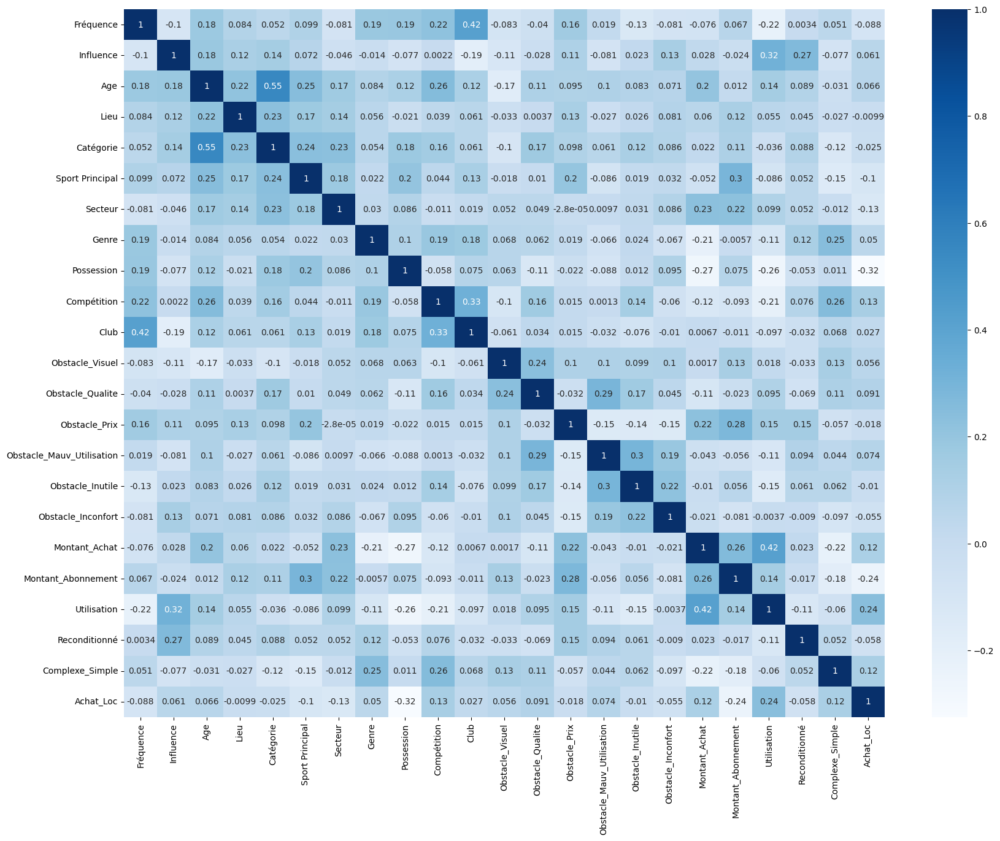

In [46]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(20,15))   
sns.heatmap(cor, annot=True,ax=ax,cmap='Blues')